<h1 id="tocheading">Table of Contents</h1>
<div id="toc"></div>

# Imports and Scripts

In [1]:
%%javascript
// ToC script
$.getScript('https://kmahelona.github.io/ipython_notebook_goodies/ipython_notebook_toc.js')

<IPython.core.display.Javascript object>

In [2]:
# Code hider, source: http://chris-said.io/2016/02/13/how-to-make-polished-jupyter-presentations-with-optional-code-visibility/
from IPython.display import HTML

HTML('''
<script>
  function code_toggle() {
    if (code_shown){
      $('div.input').hide('500');
      $('#toggleButton').val('Show Code')
    } else {
      $('div.input').show('500');
      $('#toggleButton').val('Hide Code')
    }
    code_shown = !code_shown
  }

  $( document ).ready(function(){
    code_shown=false;
    $('div.input').hide()
  });
</script>
<form action="javascript:code_toggle()"><input type="submit" id="toggleButton" value="Show Code"></form>
''')



In [255]:
# imports and constants
import json
import pickle
import datetime as dt

import gmaps
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import multiprocessing
import numpy as np
import pandas as pd
import pingouin as pg
import seaborn as sns

from IPython.display import display, HTML
import ipywidgets as widgets

# user imports
import data_processing.analysis_utils as ls_utils

%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

# Load Data

In [4]:
spin_fill_df = pd.read_pickle("ls_data/state_cluster_shift.df")

**note**: sourced originally from lifesense_cluster_change_over_time, under "Correlates Over Time" heading

In [5]:
# build cal_daily
all_cal = pd.read_pickle("wave1_features/cal_hr.df")
all_cal['date'] = all_cal['hour'].dt.floor('d')
cal_daily = all_cal.groupby(['pid', 'date']).sum()
cal_daily = cal_daily.reset_index()
cal_daily["is_wkday"] = (pd.to_datetime(cal_daily['date']).dt.dayofweek < 5).astype(float)

display(cal_daily.head())

,pid,date,tot_call_count,tot_call_duration,is_wkday
0,00746649,2019-07-23,12,1814,1.0
1,00746649,2019-07-24,15,4572,1.0
2,00746649,2019-07-25,20,2363,1.0
3,00746649,2019-07-26,15,8063,1.0
4,00746649,2019-07-27,10,1748,0.0


In [6]:
# build sms_daily
all_sms = pd.read_pickle("wave1_features/sms_hr.df")
all_sms['date'] = all_sms['hour'].dt.floor('d')
sms_daily = all_sms.groupby(['pid', 'date']).sum()
sms_daily = sms_daily.reset_index()
sms_daily["is_wkday"] = (pd.to_datetime(sms_daily['date']).dt.dayofweek < 5).astype(float)

display(sms_daily.head())

,pid,date,tot_sms_count,tot_sms_length,in_sms_count,in_sms_length,out_sms_count,out_sms_length,is_wkday
0,00746649,2019-07-23,22,1738,22.0,1738.0,0.0,0.0,1.0
1,00746649,2019-07-24,24,1464,24.0,1464.0,0.0,0.0,1.0
2,00746649,2019-07-25,14,936,14.0,936.0,0.0,0.0,1.0
3,00746649,2019-07-26,23,2135,23.0,2135.0,0.0,0.0,1.0
4,00746649,2019-07-27,21,990,21.0,990.0,0.0,0.0,0.0


In [7]:
# build fga_daily
all_fga = pd.read_pickle("wave1_features/fga_hr.df")
all_fga['all_browser'] = all_fga['browser'] + all_fga['chrome']
all_fga['date'] = all_fga['hr'].dt.floor('d')
fga_daily = all_fga.groupby(['pid', 'date']).sum()
fga_daily = fga_daily.reset_index()
fga_daily["is_wkday"] = (pd.to_datetime(fga_daily['date']).dt.dayofweek < 5).astype(float)

display(fga_daily.head())

,pid,date,katana,orca,messaging,launcher,chrome,email,instagram,youtube,maps,snapchat,browser,all_browser,is_wkday
0,00746649,2019-07-23,0.0,0.0,3380.0,1753.0,1490.0,1113.0,211.0,1080.0,240.0,0.0,165.0,1655.0,1.0
1,00746649,2019-07-24,0.0,105.0,1888.0,2831.0,965.0,713.0,1203.0,0.0,0.0,0.0,931.0,1896.0,1.0
2,00746649,2019-07-25,0.0,135.0,5835.0,1826.0,98.0,770.0,368.0,0.0,73.0,0.0,509.0,607.0,1.0
3,00746649,2019-07-26,0.0,301.0,5288.0,1986.0,195.0,1362.0,842.0,0.0,1410.0,0.0,1065.0,1260.0,1.0
4,00746649,2019-07-27,0.0,0.0,3166.0,686.0,0.0,110.0,3310.0,0.0,847.0,0.0,0.0,0.0,0.0


In [8]:
%%time
# build sloc_daily
all_sloc = pd.read_pickle("wave1_features/sloc_hr.df")
all_sloc['date'] = all_sloc['hr'].dt.floor('d')

CPU times: user 164 ms, sys: 3.67 s, total: 3.83 s
Wall time: 3.83 s


In [9]:
%%time

sloc_cols = list(all_sloc.columns[all_sloc.columns.str.endswith('dur')])
all_sloc[sloc_cols] = all_sloc[sloc_cols].clip(0, 100000000)
sloc_daily = all_sloc.groupby(['pid', 'date']).sum()
sloc_daily = sloc_daily.reset_index()
sloc_daily["is_wkday"] = (pd.to_datetime(sloc_daily['date']).dt.dayofweek < 5).astype(float)

display(sloc_daily.head())

,pid,date,food_dur,home_dur,work_dur,exercise_dur,anothers_home_dur,religion_dur,travel_dur,shopping_dur,...,n/a_religion,n/a_travel,n/a_shopping,n/a_errand,n/a_health,n/a_education,n/a_entertainment,n/a_other,tot_tansitions,is_wkday
0,00746649,2019-07-23,0.0,21869.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,1,2,0,0,0,9,1.0
1,00746649,2019-07-24,0.0,54305.0,7379.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,1,13,1.0
2,00746649,2019-07-25,0.0,48121.0,0.0,0.0,0.0,753.0,0.0,0.0,...,1,0,0,0,1,0,1,1,10,1.0
3,00746649,2019-07-26,0.0,49696.0,0.0,3824.0,3726.0,0.0,0.0,3790.0,...,0,0,2,0,1,0,1,1,17,1.0
4,00746649,2019-07-27,0.0,28339.0,0.0,536.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,6,0.0


CPU times: user 1.08 s, sys: 4.67 s, total: 5.75 s
Wall time: 5.75 s


In [10]:
drop_cols = sloc_daily.columns[sloc_daily.columns.str.contains('n/a')]
sloc_daily = sloc_daily.drop(drop_cols, axis='columns')

## Build SPIN/GAD Sequence DF

In [11]:
# load fus and circ data
fus_daily = pd.read_pickle("wave1_features/fus_gad_start_14_-1.df")
circ_dict = pickle.load(open("wave1_features/circ_gad_start_14_-1.dict", "rb"))

In [12]:
# correction for Series values in list, though it doesn't seem to have affected anything??
new_dict = {}
for col, vals in circ_dict.items():
    new_vals = []
    for v in vals:
        if isinstance(v, pd.Series):
            new_vals.append(v[0])
        else:
            new_vals.append(v)
    new_dict[col] = new_vals
circ_dict = new_dict

In [13]:
# columns
sms_cols = ['tot_sms_count', 'tot_sms_length', 'in_sms_count', 'in_sms_length', 'out_sms_count', 'out_sms_length']
cal_cols = ['tot_call_count', 'tot_call_duration']
fga_cols = ['katana', 'orca', 'messaging', 'email', 'instagram', 'youtube', 'maps', 'snapchat', 'browser', 'chrome']

circ_cols = ['circ_movt_tot', 'circ_movt_wkday', 'circ_movt_wkend']
fus_cols = list(fus_daily.columns[(fus_daily.columns.str.endswith('total') | fus_daily.columns.str.endswith('wkend') | fus_daily.columns.str.endswith('wkday')) & ~fus_daily.columns.str.startswith('date')])
sloc_cols = list(sloc_daily.columns.drop(['pid', 'date', 'is_wkday']))
#sloc_cols = list(sloc_daily.columns[sloc_daily.columns.str.endswith('dur')])

### Calculate shifted change

In [14]:
spin_fill_df['date'] = spin_fill_df['spin_start'].dt.normalize()

In [15]:
spin_fill_df['spin_total_shift'] = spin_fill_df.groupby('pid')['spin_total'].shift(1)
spin_fill_df['spin_diff'] = spin_fill_df['spin_total'] - spin_fill_df['spin_total_shift']

In [16]:
spin_fill_df['gad_total_shift'] = spin_fill_df.groupby('pid')['gad_total'].shift(1)
spin_fill_df['gad_diff'] = spin_fill_df['gad_total'] - spin_fill_df['gad_total_shift']

In [17]:
%%time

sms_dict = ls_utils.build_col_dict(sms_cols, sms_daily, spin_fill_df, 'spin_start', pre_days=14, post_days=-1)
cal_dict = ls_utils.build_col_dict(cal_cols, cal_daily, spin_fill_df, 'spin_start', pre_days=14, post_days=-1)
fga_dict = ls_utils.build_col_dict(fga_cols, fga_daily, spin_fill_df, 'spin_start', pre_days=14, post_days=-1)
sloc_dict = ls_utils.build_col_dict(sloc_cols, sloc_daily, spin_fill_df, 'spin_start', pre_days=14, post_days=-1)

CPU times: user 41.4 s, sys: 53.3 ms, total: 41.4 s
Wall time: 41.5 s


In [18]:
dig_state_df = spin_fill_df.copy()

sensor_dicts = [sms_dict, cal_dict, fga_dict, sloc_dict, circ_dict]
sensor_cols = sms_cols + cal_cols + fga_cols + sloc_cols + circ_cols

for sensor_dict in sensor_dicts:
    for col, vals in sensor_dict.items():
        dig_state_df[col] = vals

# merge fused location       
dig_state_df = dig_state_df.merge(fus_daily, how='left', on=['pid', 'study_wk'])
dig_state_df = dig_state_df.replace([np.inf, -np.inf], np.nan)

## Plots over Time

### PHQ

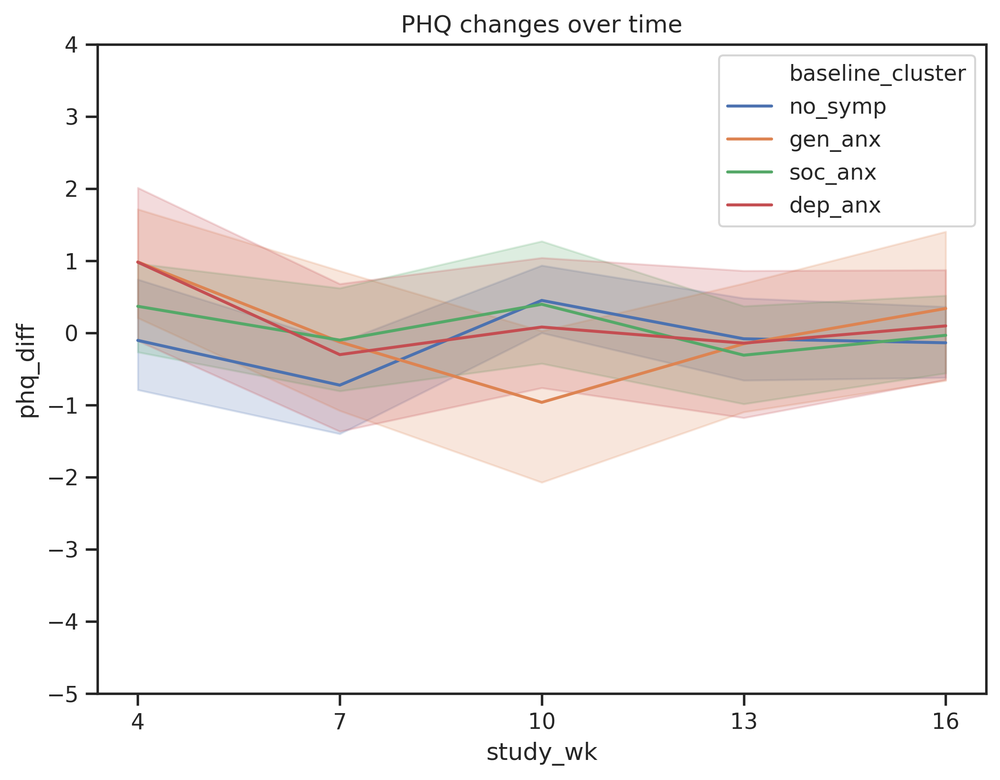

In [267]:
_, ax = plt.subplots(figsize=(8,6))
shift_df['phq_start'] = pd.to_datetime(shift_df['phq_start'])
g = sns.lineplot(x="study_wk", y="phq_diff", 
                 hue="baseline_cluster", 
                 hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                            data=shift_df, ax=ax)
plt.xticks([4, 7,10,13,16])
plt.ylim(-5,4)
plt.legend(loc="upper right")
plt.title("PHQ changes over time")
plt.show()

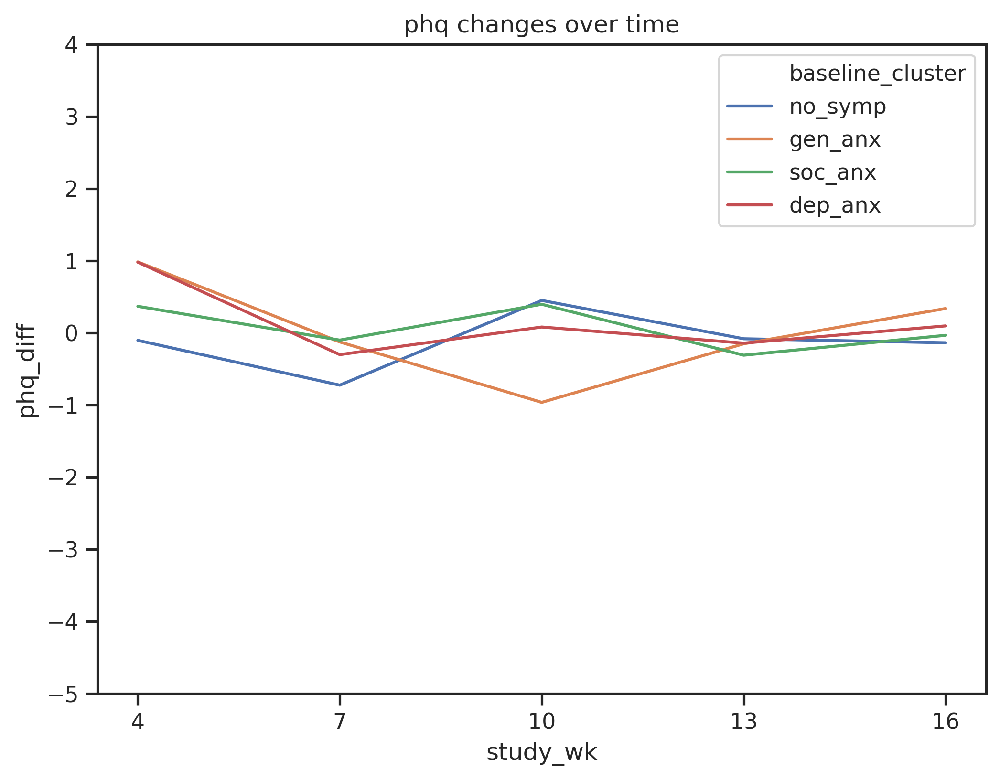

In [268]:
_, ax = plt.subplots(figsize=(8,6))
shift_df['phq_start'] = pd.to_datetime(shift_df['phq_start'])
g = sns.lineplot(x="study_wk", y="phq_diff", 
                 hue="baseline_cluster", 
                 hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                 data=shift_df, ax=ax,
                 ci=None)
plt.xticks([4,7,10,13,16])
plt.ylim(-5,4)
plt.legend(loc="upper right")
plt.title("phq changes over time")
plt.show()

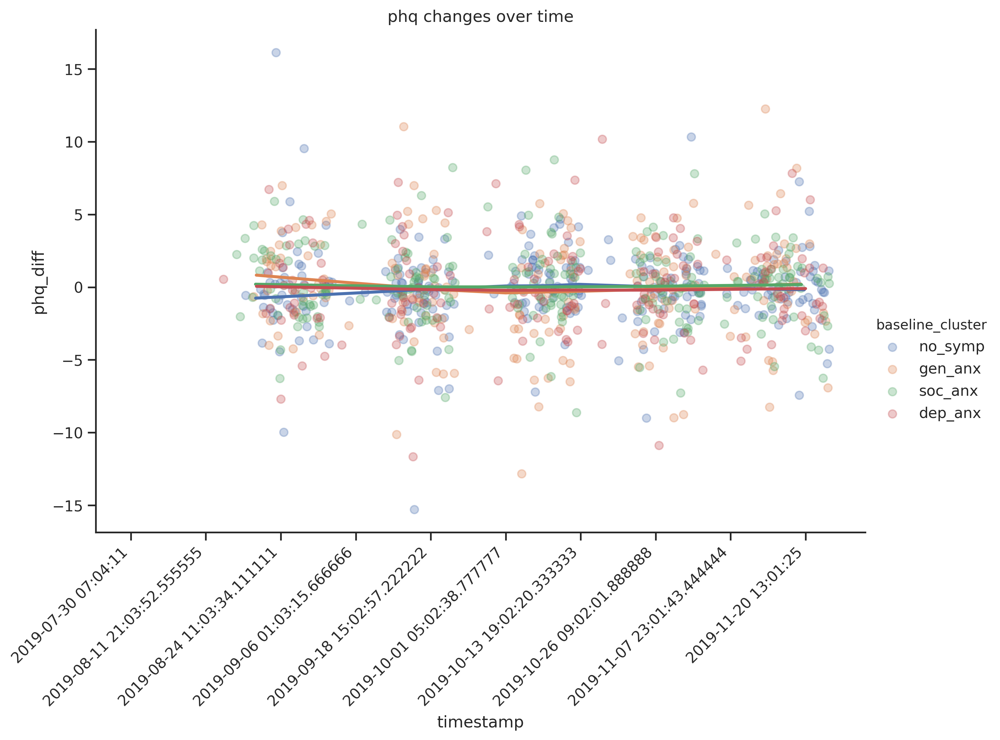

In [269]:
import matplotlib.dates as md

sns.lmplot(x='timestamp', y='phq_diff', 
           data=shift_df, 
           lowess=True, 
           hue="baseline_cluster", 
           hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
           x_jitter=500000, y_jitter=0.5,
           scatter_kws = {
               'alpha': 0.3
           },
           height=6,
           aspect=1.5
          )
ax=plt.gca()
ticks = np.linspace(shift_df['timestamp'].min(), shift_df['timestamp'].max(), 10)
idx = pd.date_range(shift_df['phq_start'].min(), shift_df['phq_start'].max(), 10).to_pydatetime()
plt.xticks(ticks, idx, rotation=45, ha='right')
#xfmt = md.DateFormatter('%Y-%m-%d')
#ax.xaxis.set_major_formatter(xfmt)
plt.title("phq changes over time")
plt.show()

In [258]:
cluster_df = pd.read_pickle("ls_data/train_cluster.df").to_frame()
cluster_df = cluster_df.reset_index()

cluster_df['cluster'] = cluster_df['cluster'].map({
    0: 'no_symp',
    1: 'soc_anx',
    2: 'gen_anx',
    3: 'dep_anx'
})

cluster_dict = {k:v for k, v in zip(cluster_df['pid'].values, cluster_df['cluster'].values)}

Text(0.5, 1.0, 'Within individual PHQ shift variance')

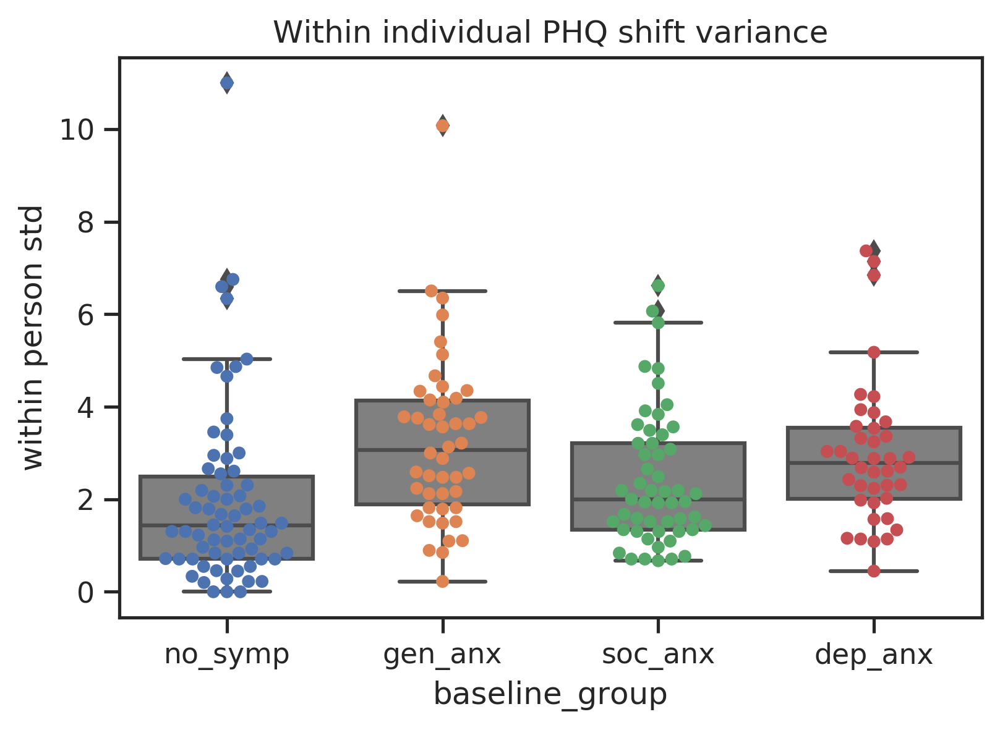

In [259]:

phq_std = shift_df.groupby('pid')['phq_diff'].std()
phq_std = phq_std.to_frame().reset_index()
phq_std['baseline_group'] = phq_std['pid'].map(cluster_dict)
phq_std = phq_std.rename(columns={'phq_diff': 'within person std'})


ax = sns.swarmplot(x="baseline_group", y='within person std', data=phq_std,
                   #hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'])
                   order=['no_symp', 'gen_anx', 'soc_anx', 'dep_anx'])
ax = sns.boxplot(x="baseline_group", y='within person std', data=phq_std, 
                 #hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                 order=['no_symp', 'gen_anx', 'soc_anx', 'dep_anx'], 
                 color=".5")
plt.title("Within individual PHQ shift variance")

### SPIN

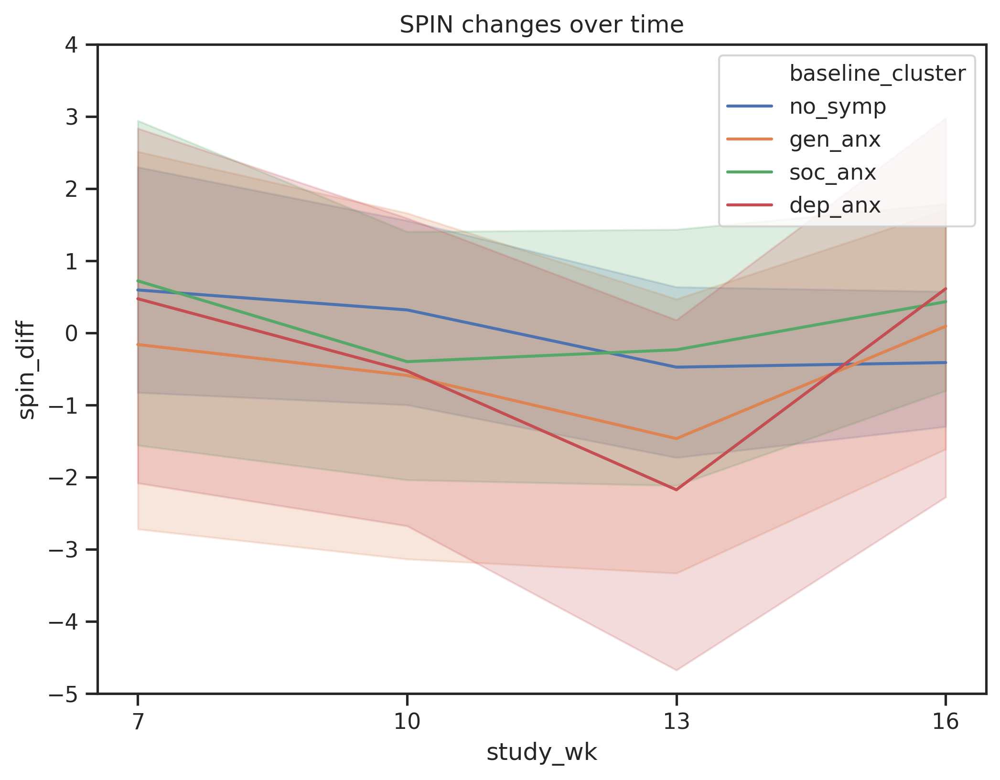

In [264]:
_, ax = plt.subplots(figsize=(8,6))
spin_fill_df['spin_start'] = pd.to_datetime(spin_fill_df['spin_start'])
g = sns.lineplot(x="study_wk", y="spin_diff", 
                 hue="baseline_cluster", 
                 hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                            data=spin_fill_df, ax=ax)
plt.xticks([7,10,13,16])
plt.ylim(-5,4)
plt.legend(loc="upper right")
plt.title("SPIN changes over time")
plt.show()

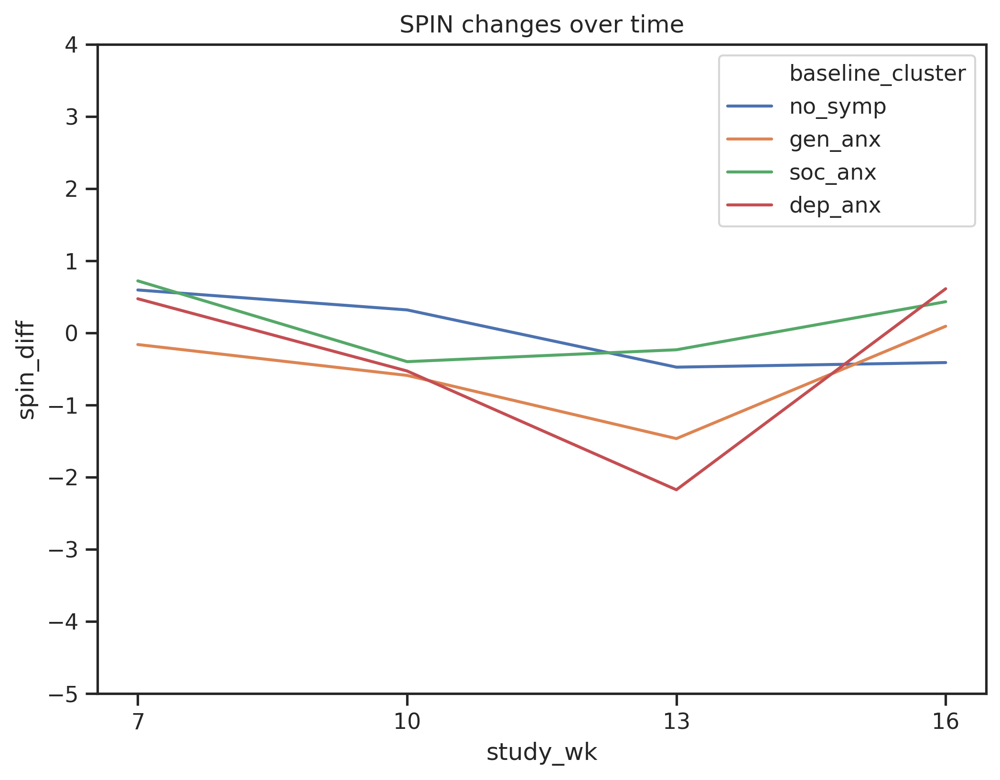

In [265]:
_, ax = plt.subplots(figsize=(8,6))
spin_fill_df['spin_start'] = pd.to_datetime(spin_fill_df['spin_start'])
g = sns.lineplot(x="study_wk", y="spin_diff", 
                 hue="baseline_cluster", 
                 hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                 data=spin_fill_df, ax=ax,
                 ci=None)
plt.xticks([7,10,13,16])
plt.ylim(-5,4)
plt.legend(loc="upper right")
plt.title("SPIN changes over time")
plt.show()

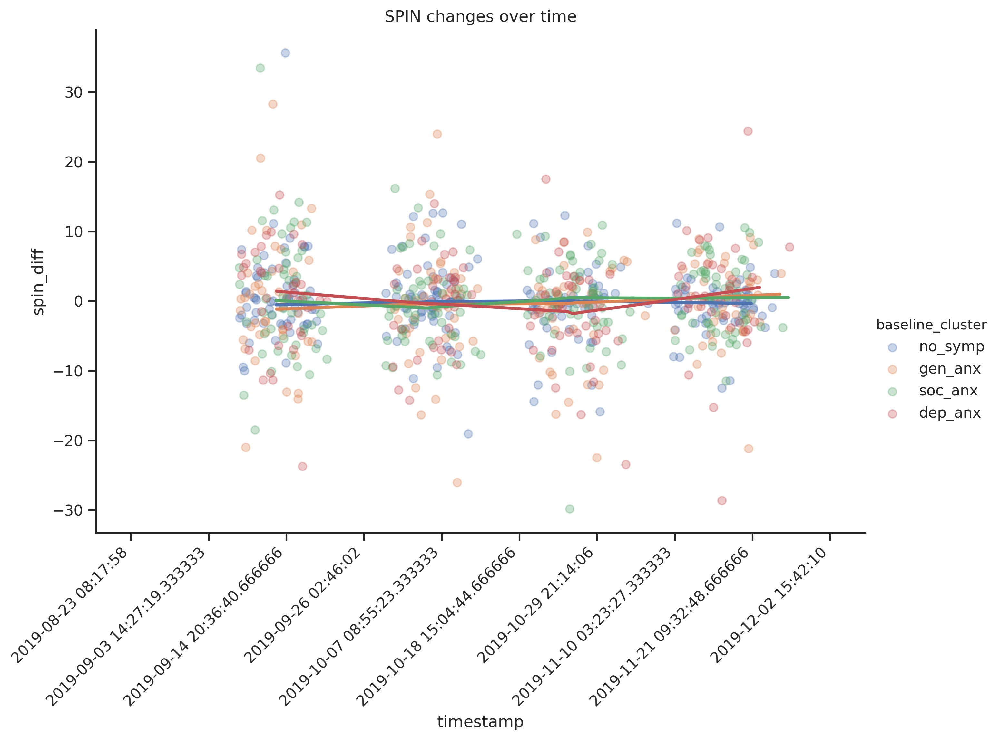

In [266]:
import matplotlib.dates as md

sns.lmplot(x='timestamp', y='spin_diff', 
           data=spin_fill_df, 
           lowess=True, 
           hue="baseline_cluster", 
           hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
           x_jitter=500000, y_jitter=0.5,
           scatter_kws = {
               'alpha': 0.3
           },
           height=6,
           aspect=1.5
          )
ax=plt.gca()
ticks = np.linspace(spin_fill_df['timestamp'].min(), spin_fill_df['timestamp'].max(), 10)
idx = pd.date_range(spin_fill_df['spin_start'].min(), spin_fill_df['spin_start'].max(), 10).to_pydatetime()
plt.xticks(ticks, idx, rotation=45, ha='right')
#xfmt = md.DateFormatter('%Y-%m-%d')
#ax.xaxis.set_major_formatter(xfmt)
plt.title("SPIN changes over time")
plt.show()

Text(0.5, 1.0, 'Within individual SPIN shift variance')

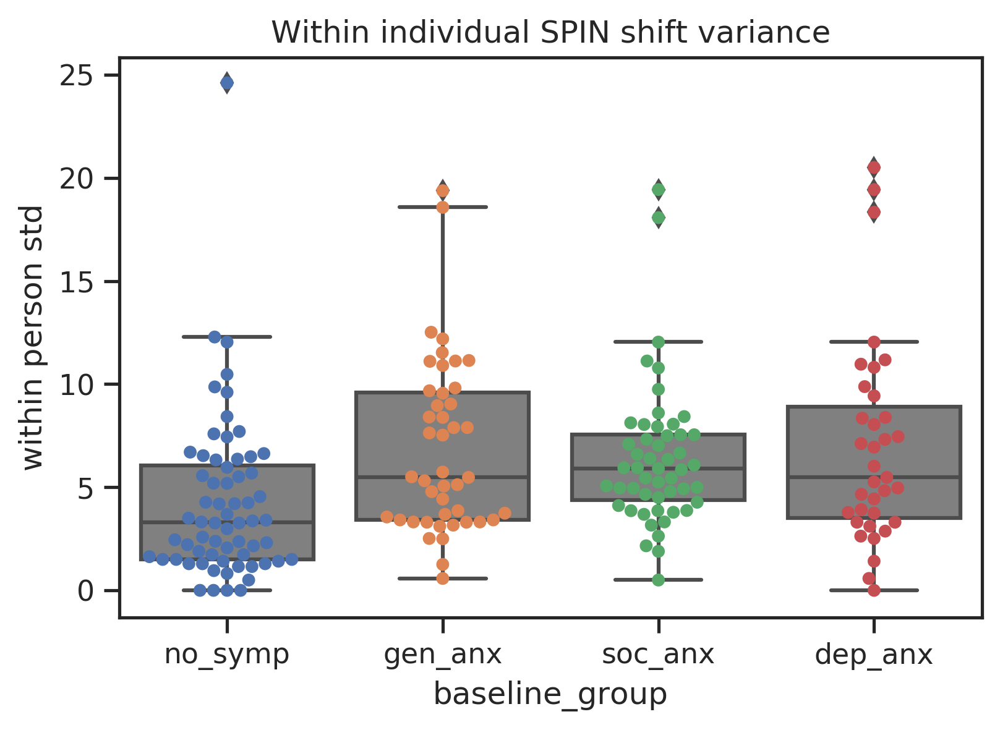

In [261]:

spin_std = spin_fill_df.groupby('pid')['spin_diff'].std()
spin_std = spin_std.to_frame().reset_index()
spin_std['baseline_group'] = spin_std['pid'].map(cluster_dict)
spin_std = spin_std.rename(columns={'spin_diff': 'within person std'})


ax = sns.swarmplot(x="baseline_group", y='within person std', data=spin_std,
                   #hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'])
                   order=['no_symp', 'gen_anx', 'soc_anx', 'dep_anx'])
ax = sns.boxplot(x="baseline_group", y='within person std', data=spin_std, 
                 #hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                 order=['no_symp', 'gen_anx', 'soc_anx', 'dep_anx'], 
                 color=".5")
plt.title("Within individual SPIN shift variance")

### GAD

In [232]:
spin_fill_df['gad_diff'] = spin_fill_df['gad_diff'].astype(float)

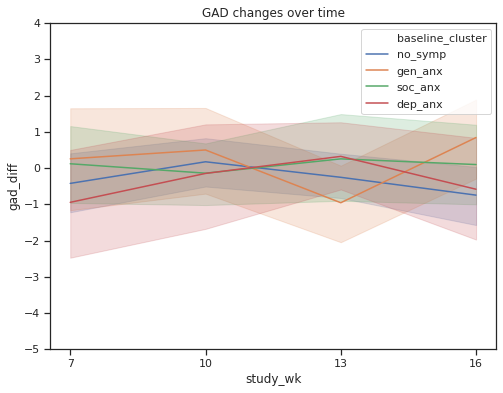

In [234]:
_, ax = plt.subplots(figsize=(8,6))
spin_fill_df['gad_start'] = pd.to_datetime(spin_fill_df['gad_start'])
g = sns.lineplot(x="study_wk", y="gad_diff", 
                 hue="baseline_cluster", 
                 hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                            data=spin_fill_df, ax=ax)
plt.xticks([7,10,13,16])
plt.ylim(-5,4)
plt.legend(loc="upper right")
plt.title("GAD changes over time")
plt.show()

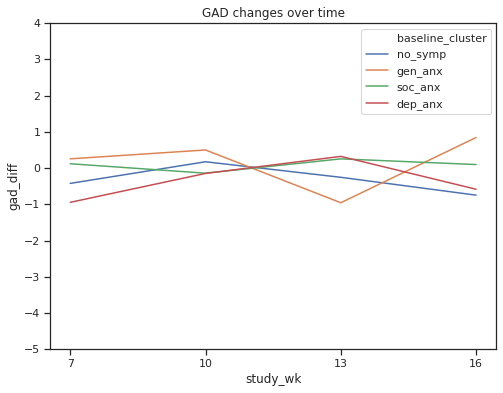

In [236]:
_, ax = plt.subplots(figsize=(8,6))
spin_fill_df['gad_start'] = pd.to_datetime(spin_fill_df['gad_start'])
g = sns.lineplot(x="study_wk", y="gad_diff", 
                 hue="baseline_cluster", 
                 hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                 data=spin_fill_df, ax=ax,
                 ci=None)
plt.xticks([7,10,13,16])
plt.ylim(-5,4)
plt.legend(loc="upper right")
plt.title("GAD changes over time")
plt.show()

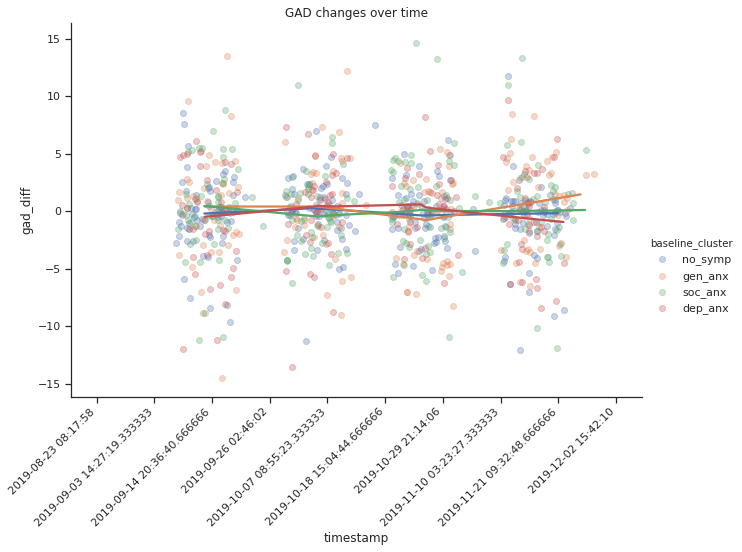

In [247]:
import matplotlib.dates as md

sns.lmplot(x='timestamp', y='gad_diff', 
           data=spin_fill_df, 
           lowess=True, 
           hue="baseline_cluster", 
           hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
           x_jitter=500000, y_jitter=0.5,
           scatter_kws = {
               'alpha': 0.3
           },
           height=6,
           aspect=1.5
          )
ax=plt.gca()
ticks = np.linspace(spin_fill_df['timestamp'].min(), spin_fill_df['timestamp'].max(), 10)
idx = pd.date_range(spin_fill_df['spin_start'].min(), spin_fill_df['spin_start'].max(), 10).to_pydatetime()
plt.xticks(ticks, idx, rotation=45, ha='right')
#xfmt = md.DateFormatter('%Y-%m-%d')
#ax.xaxis.set_major_formatter(xfmt)
plt.title("GAD changes over time")
plt.show()

Text(0.5, 1.0, 'Within individual gad shift variance')

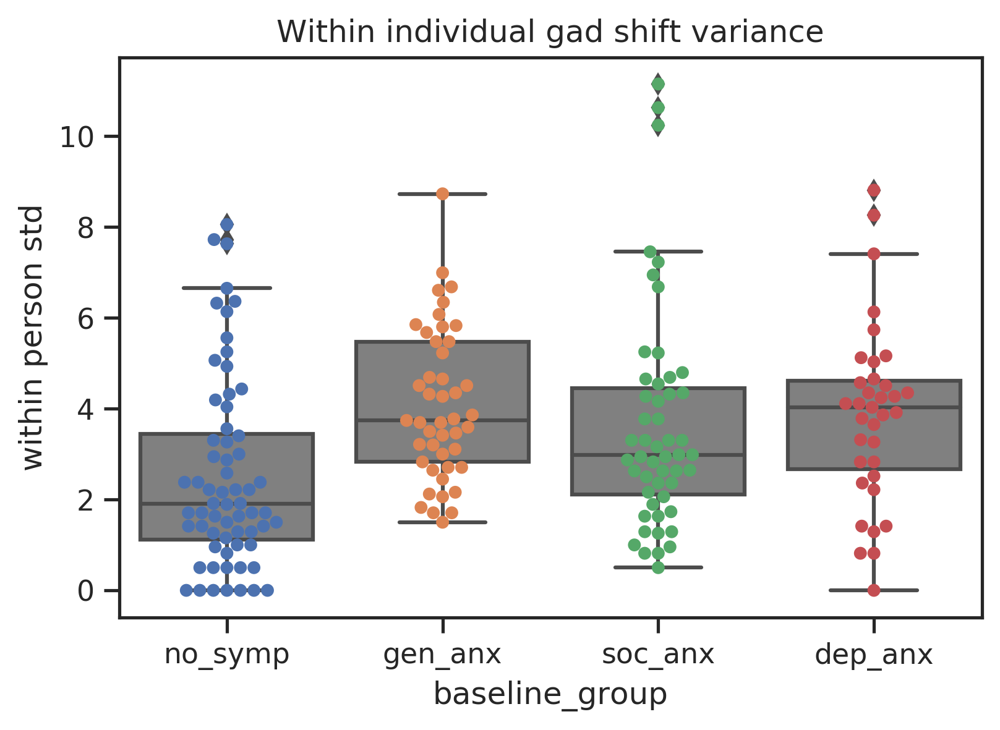

In [263]:

gad_std = spin_fill_df.groupby('pid')['gad_diff'].std()
gad_std = gad_std.to_frame().reset_index()
gad_std['baseline_group'] = gad_std['pid'].map(cluster_dict)
gad_std = gad_std.rename(columns={'gad_diff': 'within person std'})


ax = sns.swarmplot(x="baseline_group", y='within person std', data=gad_std,
                   #hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'])
                   order=['no_symp', 'gen_anx', 'soc_anx', 'dep_anx'])
ax = sns.boxplot(x="baseline_group", y='within person std', data=gad_std, 
                 #hue_order=['no_symp',  'gen_anx', 'soc_anx','dep_anx'],
                 order=['no_symp', 'gen_anx', 'soc_anx', 'dep_anx'], 
                 color=".5")
plt.title("Within individual gad shift variance")

# SPIN/GAD Feature Aggregation

In [19]:
id_cols = ['pid', 'study_wk']

## Foreground Application Aggregation

### Unit Weighting

In [20]:
active_apps = ['messaging', 'email', 'maps']
passive_apps = ['chrome', 'youtube', 'browser']
social_apps = ['orca','katana', 'instagram', 'snapchat']

agg_df = dig_state_df.copy()
agg_df[fga_cols] = (agg_df[fga_cols] - agg_df[fga_cols].mean()) / agg_df[fga_cols].std()
agg_df['active_apps_agg'] = agg_df[active_apps].mean(axis=1)
agg_df['passive_apps_agg'] = agg_df[passive_apps].mean(axis=1)
agg_df['social_apps_agg'] = agg_df[social_apps].mean(axis=1)

### PCA Weighting

In [21]:
n_comps = 5
agg_name = 'fga'
fga_pca_df, fga_transformer = ls_utils.generate_decomp_features(dig_state_df, fga_cols, id_cols, n_comps, agg_name, method='pca')

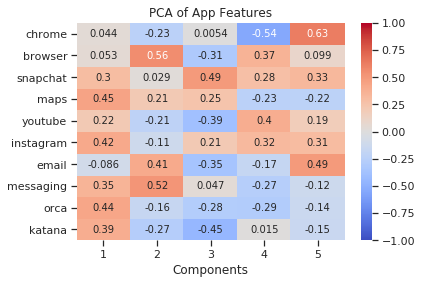

In [22]:
ls_utils.plot_decomp_components(fga_transformer, n_comps, fga_cols, "PCA of App Features")

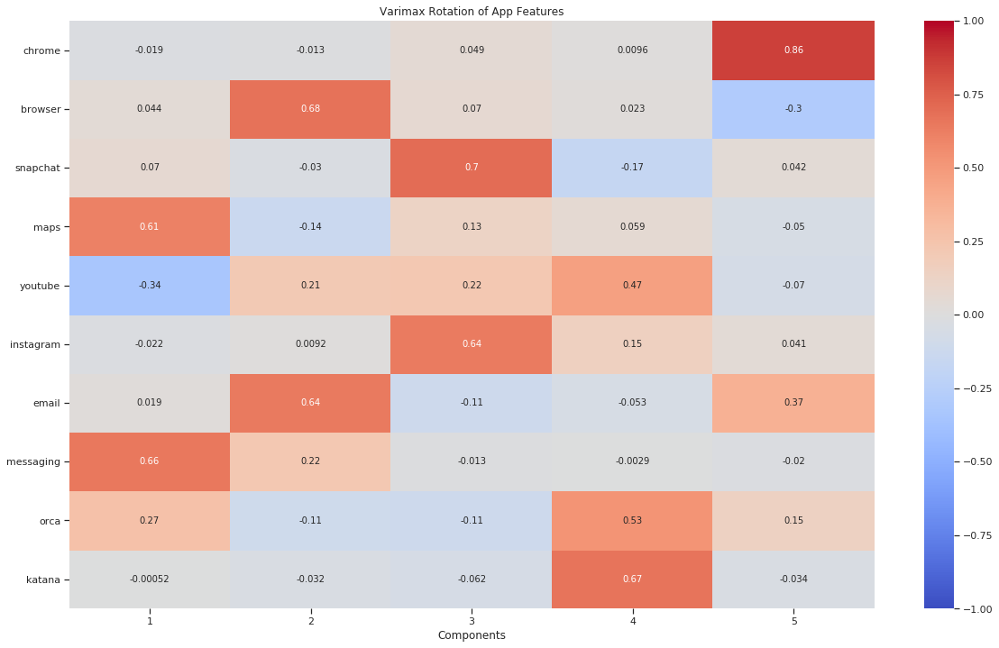

In [23]:
ls_utils.plot_varimax(fga_transformer, n_comps, fga_cols, "Varimax Rotation of App Features")

In [24]:
ls_utils.get_var_explained(fga_transformer)

,var_explained
0,0.151812
1,0.127953
2,0.122201
3,0.113489
4,0.099319


In [25]:
agg_df = agg_df.merge(fga_pca_df, how='left', on=id_cols)

## Semantic Location

In [26]:
sloc_dur_cols = sloc_daily.columns[sloc_daily.columns.str.endswith('dur')]
n_comps = 4
agg_name = 'sloc'
sloc_pca_df, sloc_transformer = ls_utils.generate_decomp_features(dig_state_df, sloc_dur_cols, id_cols, n_comps, agg_name, method='pca')

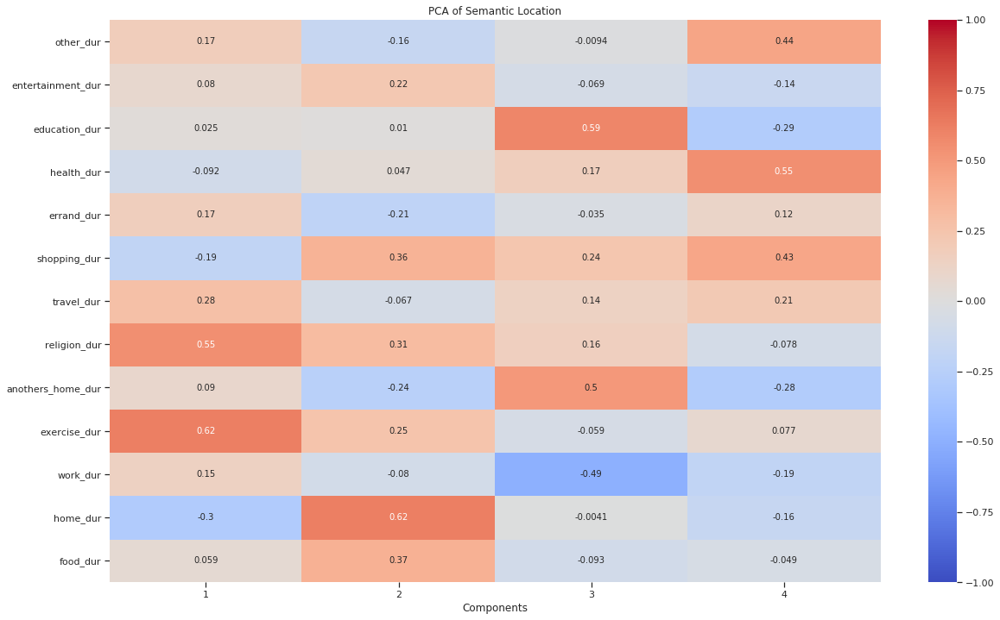

In [27]:
ls_utils.plot_decomp_components(sloc_transformer, n_comps, sloc_dur_cols, "PCA of Semantic Location")

In [28]:
ls_utils.get_var_explained(sloc_transformer)

,var_explained
0,0.124920
1,0.110971
2,0.094249
3,0.088658


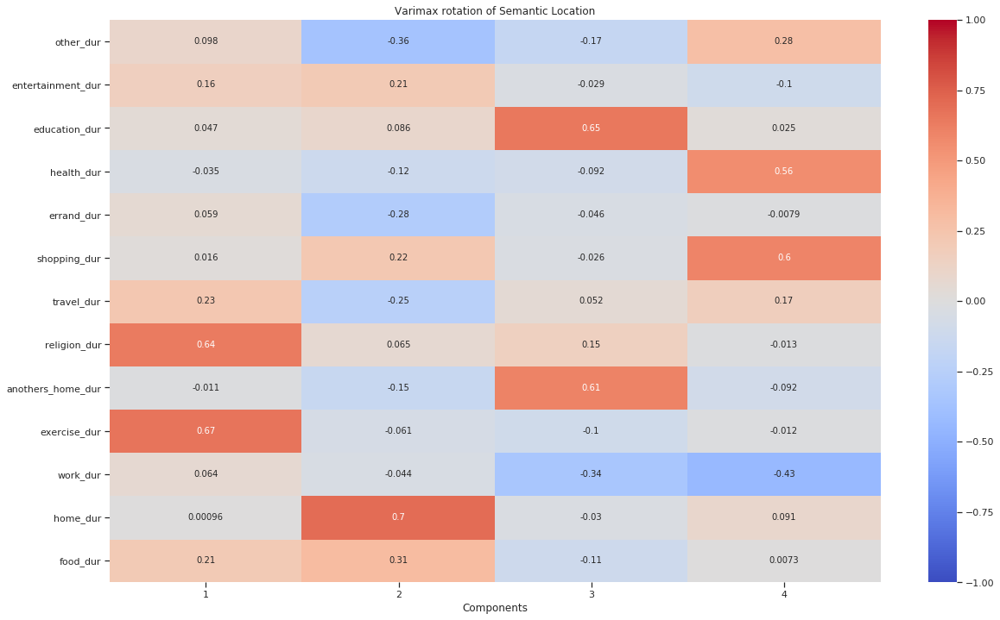

In [29]:
ls_utils.plot_varimax(sloc_transformer, n_comps, sloc_dur_cols, "Varimax rotation of Semantic Location")

In [30]:
agg_df = agg_df.merge(sloc_pca_df, how='left', on=id_cols)

## Semantic Location Transitions

- TODO

## Communication

In [31]:
agg_df[sms_cols] = (agg_df[sms_cols] - agg_df[sms_cols].mean()) / agg_df[sms_cols].std()
agg_df[cal_cols] = (agg_df[cal_cols] - agg_df[cal_cols].mean()) / agg_df[cal_cols].std()
agg_df['sms_agg'] = agg_df[sms_cols].mean(axis=1)
agg_df['cal_agg'] = agg_df[cal_cols].mean(axis=1)

## Fused Location

In [32]:
loc_cols = circ_cols + fus_cols
n_comps = 3
agg_name = 'fus'
fus_pca_df, fus_transformer = ls_utils.generate_decomp_features(dig_state_df, loc_cols, id_cols, n_comps, agg_name, method='pca')

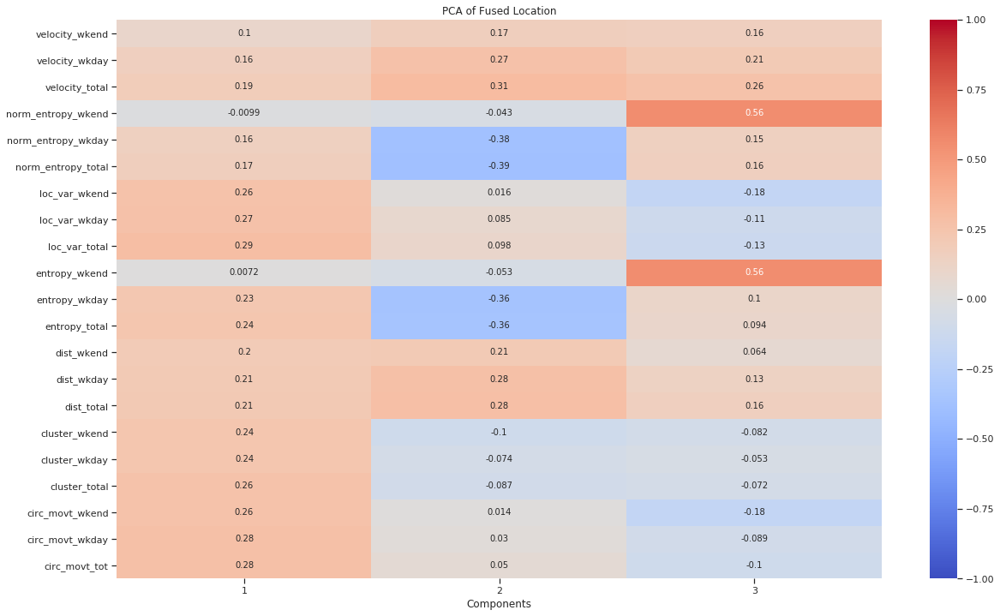

In [33]:
ls_utils.plot_decomp_components(fus_transformer, n_comps, loc_cols, "PCA of Fused Location")

In [34]:
ls_utils.get_var_explained(fus_transformer)

,var_explained
0,0.404731
1,0.148374
2,0.103680


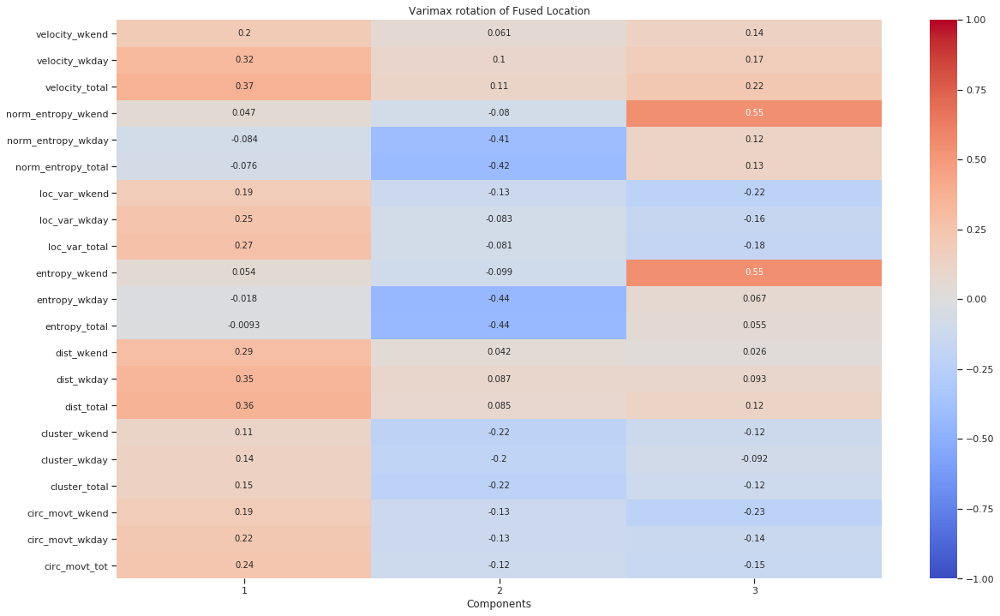

In [35]:
ls_utils.plot_varimax(fus_transformer, n_comps, loc_cols, "Varimax rotation of Fused Location")

In [36]:
agg_df = agg_df.merge(fus_pca_df, how='left', on=id_cols)

## Shift columns

In [37]:
agg_cols = agg_df.columns[agg_df.columns.str.endswith("agg")]
agg_cols_shift = [s + '_shift' for s in agg_cols]
agg_cols_change = [s + '_change' for s in agg_cols]

In [38]:
agg_df[agg_cols_shift] = agg_df.groupby('pid')[agg_cols].shift(1)

In [39]:
for cur, prev, change in zip(agg_cols, agg_cols_shift, agg_cols_change):
    agg_df[change] = agg_df[cur] - agg_df[prev]

In [40]:
agg_df['gad_diff'].describe()

count    772.000000
mean      -0.107513
std        3.695631
min      -14.000000
25%       -2.000000
50%        0.000000
75%        2.000000
max       15.000000
Name: gad_diff, dtype: float64

In [41]:
agg_df['spin_diff'].describe()

count    771.000000
mean      -0.155642
std        6.563112
min      -30.000000
25%       -3.000000
50%        0.000000
75%        3.000000
max       36.000000
Name: spin_diff, dtype: float64

# SPIN

### Simple Correlation

#### Full population

In [42]:
print("Pearson")
pair_corr_df = pg.pairwise_corr(agg_df, columns=[agg_cols_change, ['spin_diff']], padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])
print("Spearman")
pair_corr_df = pg.pairwise_corr(agg_df, columns=[agg_cols_change, ['spin_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust
1,passive_apps_agg_change,spin_diff,767,0.104,0.064177,fdr_bh


Spearman


,X,Y,n,r,p-corr,p-adjust
1,passive_apps_agg_change,spin_diff,767,0.115,0.02448,fdr_bh


#### no_symp

In [43]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'no_symp']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### soc_anx

In [44]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'soc_anx']

print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust
1,passive_apps_agg_change,spin_diff,202,0.224,0.023506,fdr_bh
11,sloc_pca4_agg_change,spin_diff,202,-0.196,0.044517,fdr_bh


Spearman


,X,Y,n,r,p-corr,p-adjust
1,passive_apps_agg_change,spin_diff,202,0.195,0.092459,fdr_bh


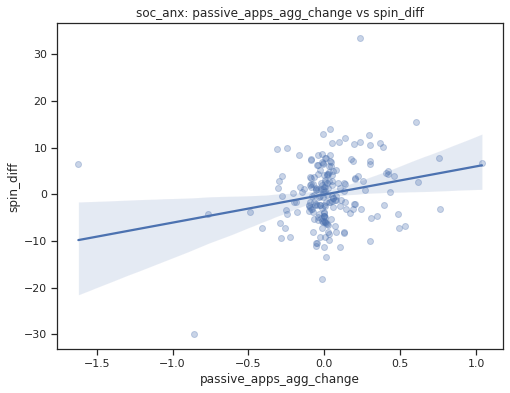

In [45]:
ls_utils.plot_cluster_scatter('passive_apps_agg_change', 'spin_diff', sel_state_df, 'soc_anx', (8,6))

#### gen_anx

In [46]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'gen_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', method='pearson', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust
4,fga_pca2_agg_change,spin_diff,175,-0.218,0.063313,fdr_bh


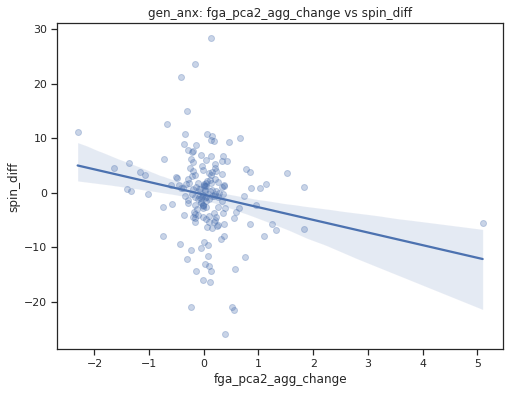

In [49]:
ls_utils.plot_cluster_scatter('fga_pca2_agg_change', 'spin_diff', sel_state_df, 'gen_anx', (8,6))

#### dep_anx

In [50]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'dep_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr'))

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,method,tail,n,r,CI95%,r2,adj_r2,z,p-unc,p-corr,p-adjust,power


# GAD

### Simple Correlation

#### Full population

In [51]:
print("Pearson")
pair_corr_df = pg.pairwise_corr(agg_df, columns=[agg_cols_change, ['gad_diff']], padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])
print("Spearman")
pair_corr_df = pg.pairwise_corr(agg_df, columns=[agg_cols_change, ['gad_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust
13,cal_agg_change,gad_diff,758,0.114,0.029436,fdr_bh
0,active_apps_agg_change,gad_diff,768,0.100,0.038535,fdr_bh
4,fga_pca2_agg_change,gad_diff,768,0.098,0.038535,fdr_bh


#### no_symp

In [52]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'no_symp']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### soc_anx

In [53]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'soc_anx']

print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust
0,active_apps_agg_change,gad_diff,202,0.199,0.076667,fdr_bh


#### gen_anx

In [54]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'gen_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', method='pearson', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust
0,active_apps_agg_change,gad_diff,176,0.240,0.011131,fdr_bh
4,fga_pca2_agg_change,gad_diff,176,0.248,0.011131,fdr_bh
5,fga_pca3_agg_change,gad_diff,176,0.197,0.049059,fdr_bh


#### dep_anx

In [55]:
sel_state_df = agg_df[agg_df['baseline_cluster'] == 'dep_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust
2,social_apps_agg_change,gad_diff,138,-0.259,0.036956,fdr_bh
3,fga_pca1_agg_change,gad_diff,138,-0.218,0.087351,fdr_bh


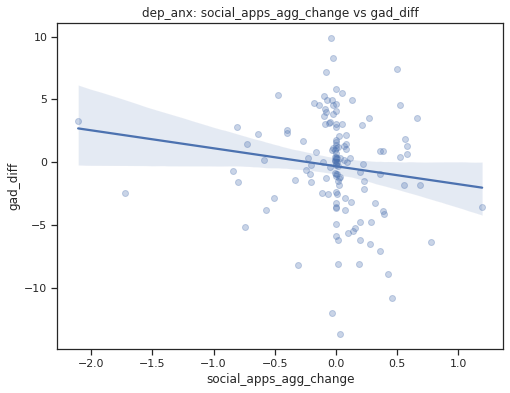

In [57]:
ls_utils.plot_cluster_scatter('social_apps_agg_change', 'gad_diff', agg_df, 'dep_anx', (8,6))

# Reverse SPIN/GAD

## Build reversed df

In [319]:
# load fus and circ data
rev_fus_daily = pd.read_pickle("wave1_features/fus_gad_start_0_14.df")
rev_circ_dict = pickle.load(open("wave1_features/circ_gad_start_0_14.dict", "rb"))

In [320]:
# correction for Series values in list, though it doesn't seem to have affected anything??
rev_new_dict = {}
for col, vals in rev_circ_dict.items():
    new_vals = []
    for v in vals:
        if isinstance(v, pd.Series):
            new_vals.append(v[0])
        else:
            new_vals.append(v)
    rev_new_dict[col] = new_vals
rev_circ_dict = rev_new_dict

### Calculate shifted change

In [291]:
spin_fill_df['date'] = spin_fill_df['spin_start'].dt.normalize()

In [292]:
spin_fill_df['spin_total_shift'] = spin_fill_df.groupby('pid')['spin_total'].shift(1)
spin_fill_df['spin_diff'] = spin_fill_df['spin_total'] - spin_fill_df['spin_total_shift']

In [293]:
spin_fill_df['gad_total_shift'] = spin_fill_df.groupby('pid')['gad_total'].shift(1)
spin_fill_df['gad_diff'] = spin_fill_df['gad_total'] - spin_fill_df['gad_total_shift']

In [294]:
%%time

sms_dict = ls_utils.build_col_dict(sms_cols, sms_daily, spin_fill_df, 'spin_start', pre_days=0, post_days=14)
cal_dict = ls_utils.build_col_dict(cal_cols, cal_daily, spin_fill_df, 'spin_start', pre_days=0, post_days=14)
fga_dict = ls_utils.build_col_dict(fga_cols, fga_daily, spin_fill_df, 'spin_start', pre_days=0, post_days=14)
sloc_dict = ls_utils.build_col_dict(sloc_cols, sloc_daily, spin_fill_df, 'spin_start', pre_days=0, post_days=14)

CPU times: user 1min 6s, sys: 142 ms, total: 1min 6s
Wall time: 1min 8s


In [322]:
rev_dig_state_df = spin_fill_df.copy()

sensor_dicts = [sms_dict, cal_dict, fga_dict, sloc_dict, rev_circ_dict]
sensor_cols = sms_cols + cal_cols + fga_cols + sloc_cols + circ_cols

for sensor_dict in sensor_dicts:
    for col, vals in sensor_dict.items():
        rev_dig_state_df[col] = vals

# merge fused location       
rev_dig_state_df = rev_dig_state_df.merge(fus_daily, how='left', on=['pid', 'study_wk'])
rev_dig_state_df = rev_dig_state_df.replace([np.inf, -np.inf], np.nan)

## Aggregate features

### Foreground Application

In [323]:
rev_agg_df = rev_dig_state_df.copy()
rev_agg_df[fga_cols] = (rev_agg_df[fga_cols] - rev_agg_df[fga_cols].mean()) / rev_agg_df[fga_cols].std()
rev_agg_df['active_apps_agg'] = rev_agg_df[active_apps].mean(axis=1)
rev_agg_df['passive_apps_agg'] = rev_agg_df[passive_apps].mean(axis=1)
rev_agg_df['social_apps_agg'] = rev_agg_df[social_apps].mean(axis=1)

In [324]:
n_comps = 5
agg_name = 'fga'
fga_pca_df, fga_transformer = ls_utils.generate_decomp_features(rev_dig_state_df, fga_cols, id_cols, n_comps, agg_name, method='pca')

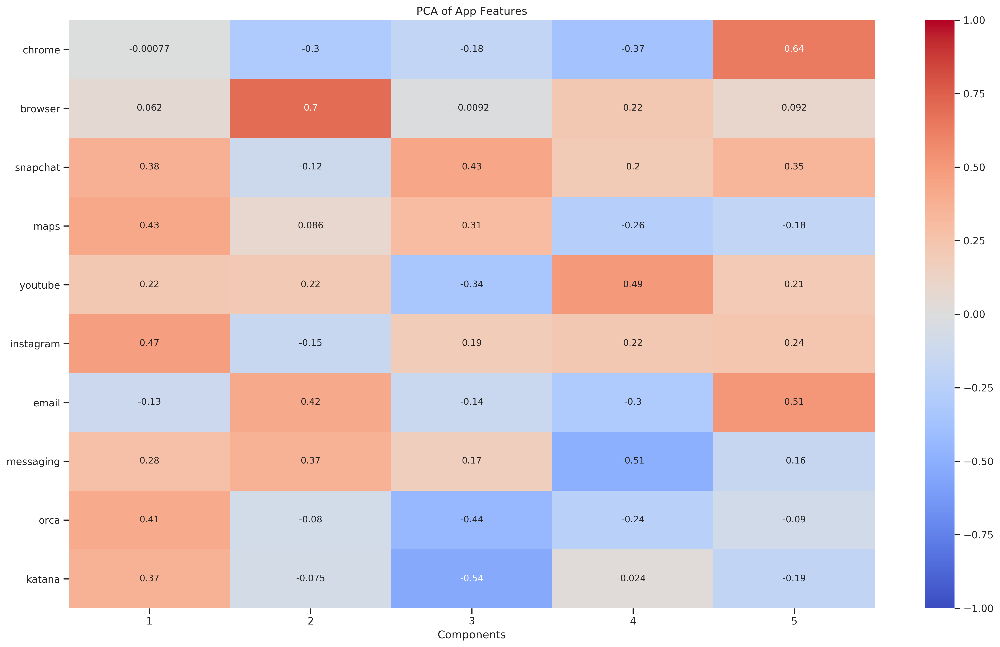

In [325]:
ls_utils.plot_decomp_components(fga_transformer, n_comps, fga_cols, "PCA of App Features")

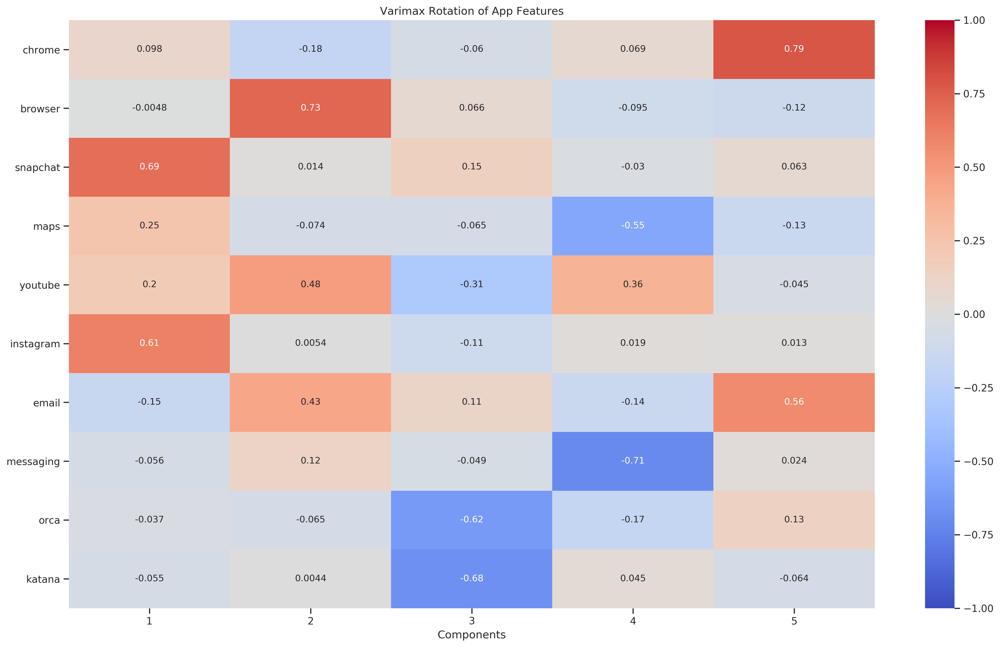

In [326]:
ls_utils.plot_varimax(fga_transformer, n_comps, fga_cols, "Varimax Rotation of App Features")

In [327]:
ls_utils.get_var_explained(fga_transformer)

,var_explained
0,0.150808
1,0.127781
2,0.124920
3,0.113743
4,0.100519


In [328]:
rev_agg_df = rev_agg_df.merge(fga_pca_df, how='left', on=id_cols)

### Semantic Location

In [329]:
sloc_dur_cols = sloc_daily.columns[sloc_daily.columns.str.endswith('dur')]
n_comps = 4
agg_name = 'sloc'
sloc_pca_df, sloc_transformer = ls_utils.generate_decomp_features(rev_dig_state_df, sloc_dur_cols, id_cols, n_comps, agg_name, method='pca')

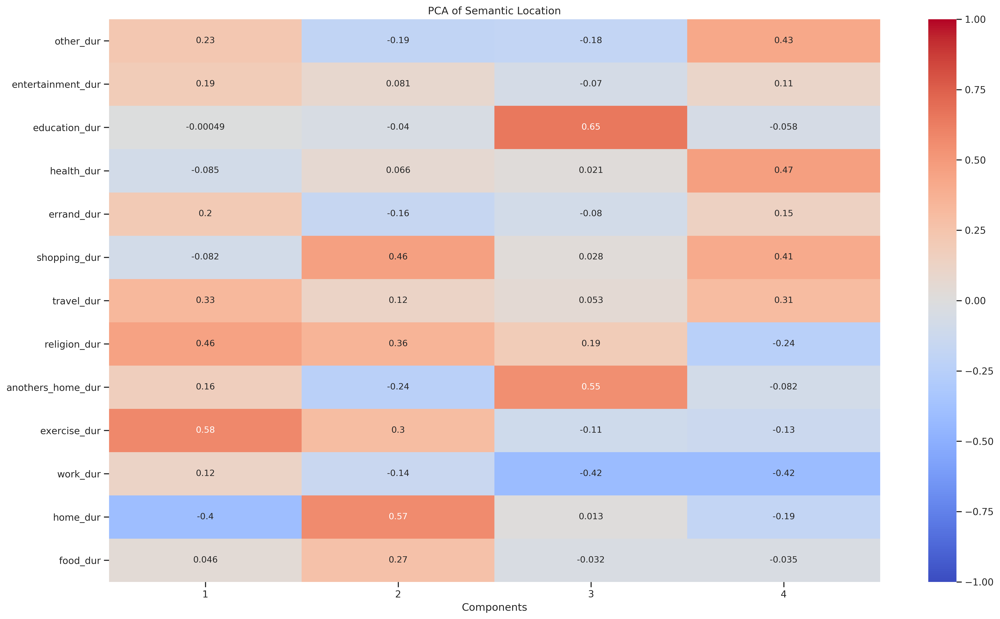

In [330]:
ls_utils.plot_decomp_components(sloc_transformer, n_comps, sloc_dur_cols, "PCA of Semantic Location")

In [331]:
ls_utils.get_var_explained(sloc_transformer)

,var_explained
0,0.120829
1,0.108995
2,0.094554
3,0.087397


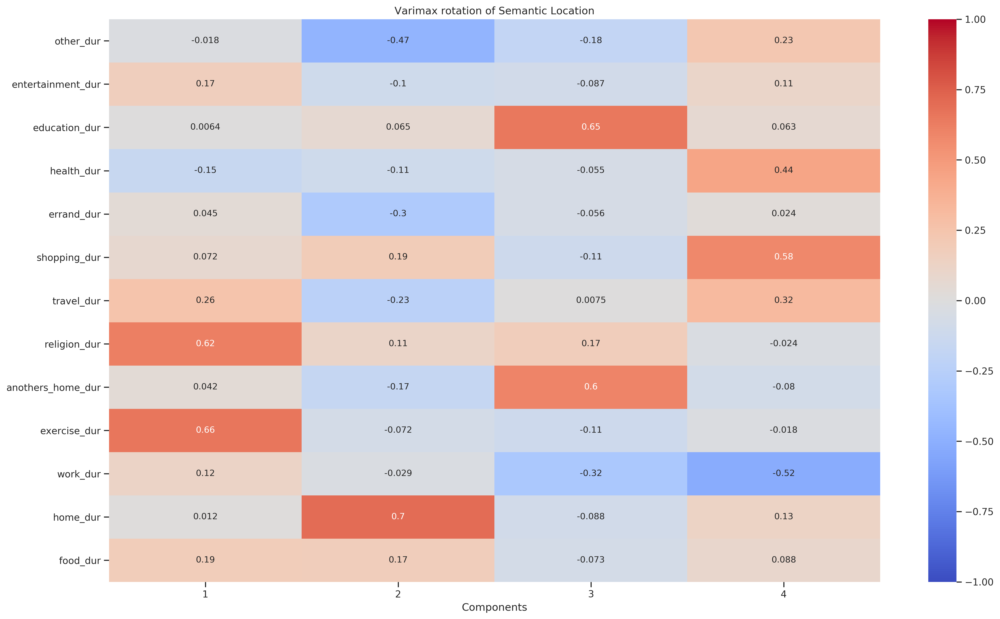

In [332]:
ls_utils.plot_varimax(sloc_transformer, n_comps, sloc_dur_cols, "Varimax rotation of Semantic Location")

In [333]:
rev_agg_df = rev_agg_df.merge(sloc_pca_df, how='left', on=id_cols)

### Semantic Location Transitions

- TODO

### Communication

In [334]:
rev_agg_df[sms_cols] = (rev_agg_df[sms_cols] - rev_agg_df[sms_cols].mean()) / rev_agg_df[sms_cols].std()
rev_agg_df[cal_cols] = (rev_agg_df[cal_cols] - rev_agg_df[cal_cols].mean()) / rev_agg_df[cal_cols].std()
rev_agg_df['sms_agg'] = rev_agg_df[sms_cols].mean(axis=1)
rev_agg_df['cal_agg'] = rev_agg_df[cal_cols].mean(axis=1)

### Fused Location

In [335]:
loc_cols = circ_cols + fus_cols
n_comps = 3
agg_name = 'fus'
fus_pca_df, fus_transformer = ls_utils.generate_decomp_features(rev_dig_state_df, loc_cols, id_cols, n_comps, agg_name, method='pca')

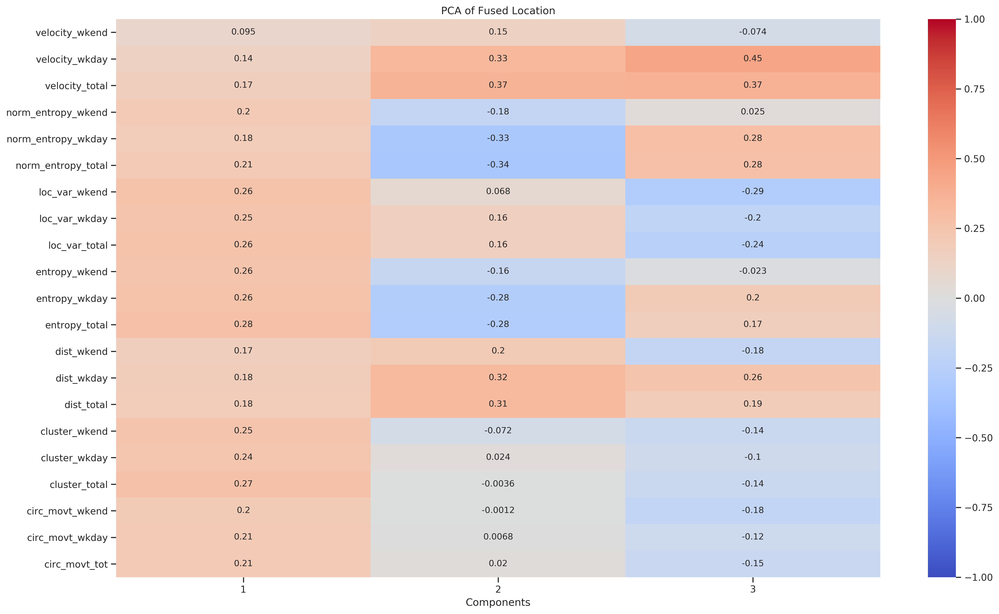

In [336]:
ls_utils.plot_decomp_components(fus_transformer, n_comps, loc_cols, "PCA of Fused Location")

In [337]:
ls_utils.get_var_explained(fus_transformer)

,var_explained
0,0.396445
1,0.163825
2,0.104554


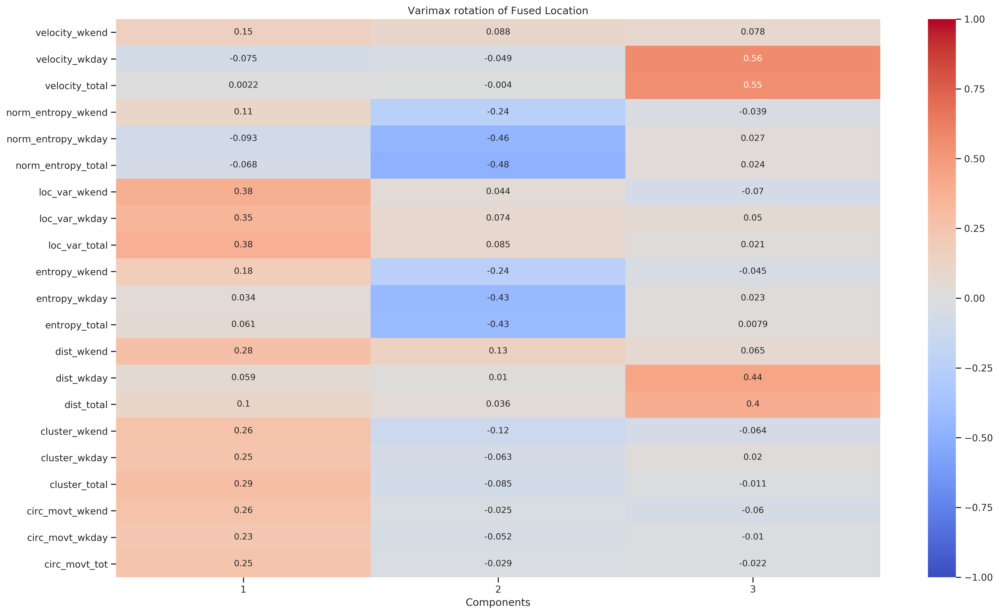

In [338]:
ls_utils.plot_varimax(fus_transformer, n_comps, loc_cols, "Varimax rotation of Fused Location")

In [339]:
rev_agg_df = rev_agg_df.merge(fus_pca_df, how='left', on=id_cols)

## Shift columns

In [340]:
agg_cols = rev_agg_df.columns[rev_agg_df.columns.str.endswith("agg")]
agg_cols_shift = [s + '_shift' for s in agg_cols]
agg_cols_change = [s + '_change' for s in agg_cols]

In [341]:
rev_agg_df[agg_cols_shift] = rev_agg_df.groupby('pid')[agg_cols].shift(1)

In [342]:
for cur, prev, change in zip(agg_cols, agg_cols_shift, agg_cols_change):
    rev_agg_df[change] = rev_agg_df[cur] - rev_agg_df[prev]

In [343]:
rev_agg_df['gad_diff'].describe()

count    772.000000
mean      -0.107513
std        3.695631
min      -14.000000
25%       -2.000000
50%        0.000000
75%        2.000000
max       15.000000
Name: gad_diff, dtype: float64

In [344]:
rev_agg_df['spin_diff'].describe()

count    771.000000
mean      -0.155642
std        6.563112
min      -30.000000
25%       -3.000000
50%        0.000000
75%        3.000000
max       36.000000
Name: spin_diff, dtype: float64

## GAD Correlations

#### Full population

In [345]:
print("Pearson")
pair_corr_df = pg.pairwise_corr(rev_agg_df, columns=[agg_cols_change, ['gad_diff']], padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])
print("Spearman")
pair_corr_df = pg.pairwise_corr(rev_agg_df, columns=[agg_cols_change, ['gad_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### no_symp

In [346]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'no_symp']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### soc_anx

In [347]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'soc_anx']

print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### gen_anx

In [348]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'gen_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', method='pearson', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### dep_anx

In [349]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'dep_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['gad_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


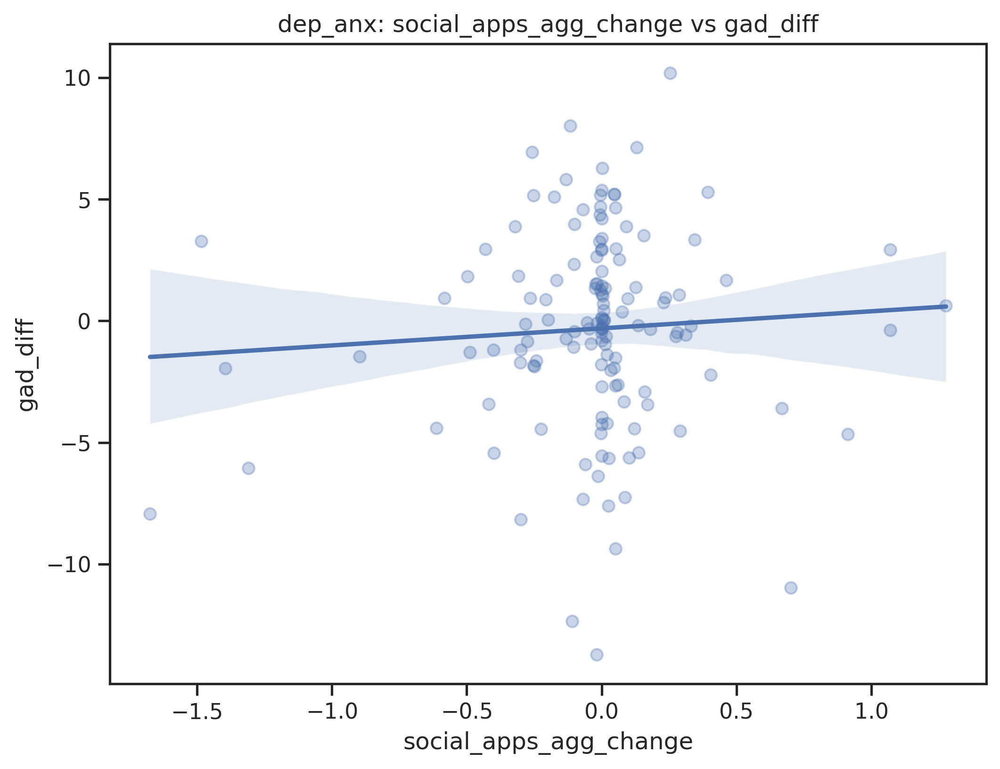

In [350]:
ls_utils.plot_cluster_scatter('social_apps_agg_change', 'gad_diff', rev_agg_df, 'dep_anx', (8,6))

## SPIN Correlations

#### Full population

In [351]:
print("Pearson")
pair_corr_df = pg.pairwise_corr(rev_agg_df, columns=[agg_cols_change, ['spin_diff']], padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])
print("Spearman")
pair_corr_df = pg.pairwise_corr(rev_agg_df, columns=[agg_cols_change, ['spin_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### no_symp

In [352]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'no_symp']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### soc_anx

In [353]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'soc_anx']

print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


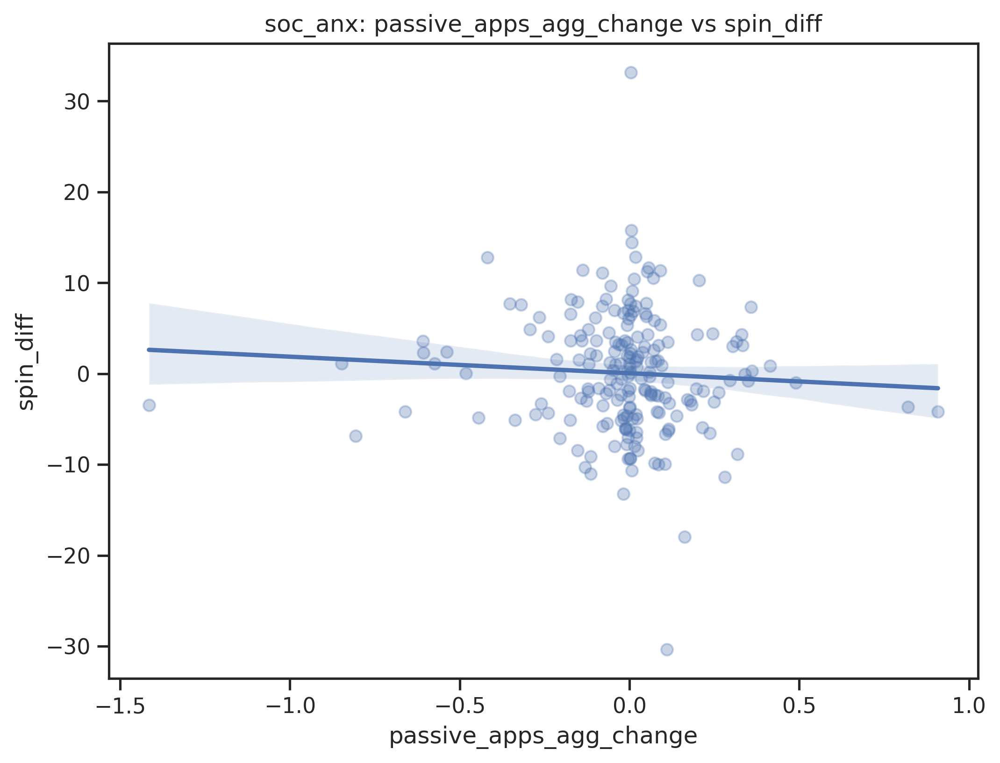

In [354]:
ls_utils.plot_cluster_scatter('passive_apps_agg_change', 'spin_diff', sel_state_df, 'soc_anx', (8,6))

#### gen_anx

In [355]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'gen_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', method='pearson', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


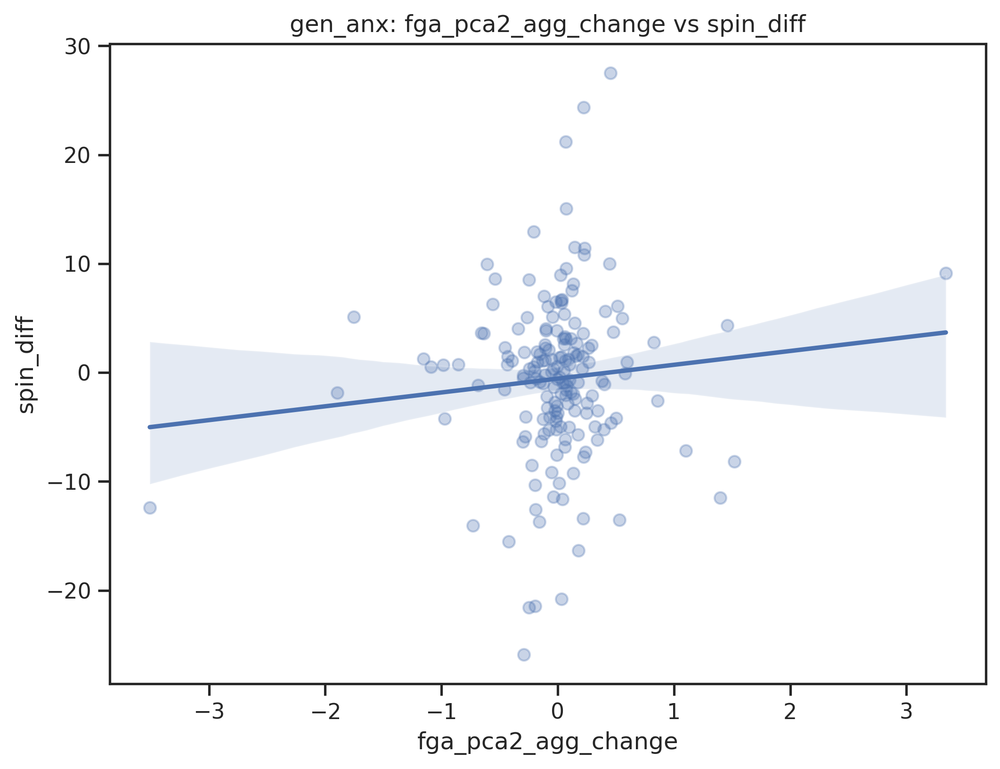

In [356]:
ls_utils.plot_cluster_scatter('fga_pca2_agg_change', 'spin_diff', sel_state_df, 'gen_anx', (8,6))

#### dep_anx

In [357]:
sel_state_df = rev_agg_df[rev_agg_df['baseline_cluster'] == 'dep_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['spin_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr'))

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,method,tail,n,r,CI95%,r2,adj_r2,z,p-unc,p-corr,p-adjust,power


# Build SPIN/GAD Correlation Tables

In [469]:
sel_agg_cols = [x for x in agg_cols_change if 'fga' not in x]

groups = ['all', 'no_symp', 'soc_anx', 'gen_anx', 'dep_anx']
def build_corr_table(df, x, target, title, method='pearson'):
    
    table = pd.DataFrame()
    for group in groups:
        if group == 'all':
            sel_df = df
        else:
            sel_df = df[df['baseline_cluster']  == group]
        corr_df = pg.pairwise_corr(sel_df, columns=[sel_agg_cols, [target]], nan_policy='pairwise', padjust="fdr_bh", method=method)
        corr_df['group'] = group
        #print(corr_df.head())
        corr_df = corr_df[corr_df['X'] == x]
        table = table.append(corr_df[['group', 'n', 'r', 'p-corr', 'p-adjust']])
        
    table = table.reset_index(drop=True)
        
    return table.style.set_caption(title)

In [471]:
build_corr_table(agg_df, 'passive_apps_agg_change', 'spin_diff', 'passive app change to SPIN change')

,group,n,r,p-corr,p-adjust
0,all,767,0.104,0.0453017,fdr_bh
1,no_symp,252,0.092,0.927819,fdr_bh
2,soc_anx,202,0.224,0.0165924,fdr_bh
3,gen_anx,175,0.011,0.969062,fdr_bh
4,dep_anx,138,0.144,0.667195,fdr_bh


In [474]:
build_corr_table(rev_agg_df, 'passive_apps_agg_change', 'spin_diff', 'SPIN change to passive app change')

,group,n,r,p-corr,p-adjust
0,all,764,0.014,0.846841,fdr_bh
1,no_symp,252,0.014,0.922621,fdr_bh
2,soc_anx,201,-0.065,0.543705,fdr_bh
3,gen_anx,174,0.047,0.855097,fdr_bh
4,dep_anx,137,0.075,0.731725,fdr_bh


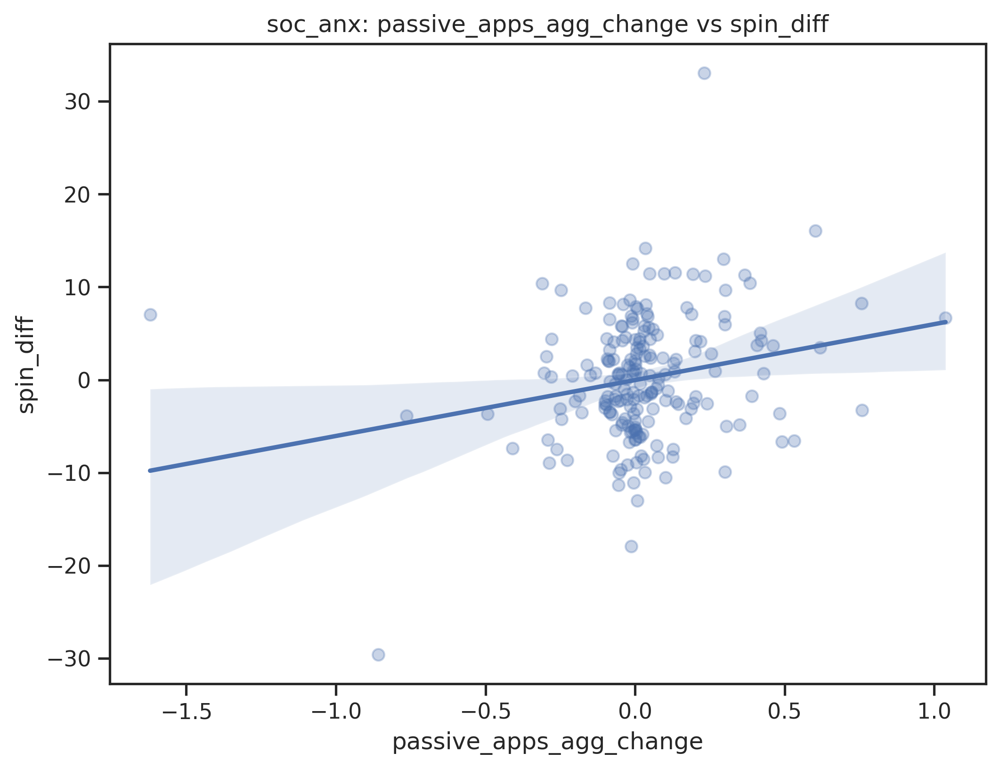

In [487]:
ls_utils.plot_cluster_scatter('passive_apps_agg_change', 'spin_diff', agg_df, 'soc_anx', (8,6))

In [481]:
build_corr_table(phq_agg_df, 'fus_pca1_agg_change', 'phq_diff', 'location PCA change to PHQ change')

,group,n,r,p-corr,p-adjust
0,all,761,-0.127,0.00538265,fdr_bh
1,no_symp,240,-0.041,0.700345,fdr_bh
2,soc_anx,209,-0.095,0.705285,fdr_bh
3,gen_anx,170,-0.085,0.634279,fdr_bh
4,dep_anx,142,-0.353,0.000179039,fdr_bh


In [482]:
build_corr_table(rev_phq_agg_df, 'fus_pca1_agg_change', 'phq_diff', 'PHQ change to location PCA change')

,group,n,r,p-corr,p-adjust
0,all,665,-0.019,0.755018,fdr_bh
1,no_symp,206,-0.068,0.598984,fdr_bh
2,soc_anx,185,-0.127,0.34023,fdr_bh
3,gen_anx,146,-0.018,0.893506,fdr_bh
4,dep_anx,128,0.172,0.156484,fdr_bh


In [486]:
build_corr_table(agg_df, 'active_apps_agg_change', 'gad_diff', 'location PCA change to GAD change', method='spearman')

,group,n,r,p-corr,p-adjust
0,all,768,0.1,0.0322725,fdr_bh
1,no_symp,252,0.017,0.839198,fdr_bh
2,soc_anx,202,0.199,0.0541176,fdr_bh
3,gen_anx,176,0.24,0.0157145,fdr_bh
4,dep_anx,138,-0.067,0.887283,fdr_bh


In [482]:
build_corr_table(rev_phq_agg_df, 'fus_pca1_agg_change', 'phq_diff', 'PHQ change to location PCA change')

,group,n,r,p-corr,p-adjust
0,all,665,-0.019,0.755018,fdr_bh
1,no_symp,206,-0.068,0.598984,fdr_bh
2,soc_anx,185,-0.127,0.34023,fdr_bh
3,gen_anx,146,-0.018,0.893506,fdr_bh
4,dep_anx,128,0.172,0.156484,fdr_bh


# PHQ: 14 day lookback

In [58]:
shift_df = pd.read_pickle("ls_data/phq_cluster_shift.df")

In [59]:
# load fus and circ data
fus_daily = pd.read_pickle("wave1_features/fus_phq_start_14_-1.df")
circ_dict = pickle.load(open("wave1_features/circ_phq_start_14_-1.dict", "rb"))

In [60]:
# correction for Series values in list, though it doesn't seem to have affected anything??
new_dict = {}
for col, vals in circ_dict.items():
    new_vals = []
    for v in vals:
        if isinstance(v, pd.Series):
            new_vals.append(v[0])
        else:
            new_vals.append(v)
    new_dict[col] = new_vals
circ_dict = new_dict

In [61]:
shift_df['date'] = shift_df['phq_start'].dt.normalize()

In [63]:
%%time

sms_dict = ls_utils.build_col_dict(sms_cols, sms_daily, shift_df, 'phq_start', pre_days=14, post_days=-1)
cal_dict = ls_utils.build_col_dict(cal_cols, cal_daily, shift_df, 'phq_start', pre_days=14, post_days=-1)
fga_dict = ls_utils.build_col_dict(fga_cols, fga_daily, shift_df, 'phq_start', pre_days=14, post_days=-1)
sloc_dict = ls_utils.build_col_dict(sloc_cols, sloc_daily, shift_df, 'phq_start', pre_days=14, post_days=-1)

CPU times: user 44.7 s, sys: 0 ns, total: 44.7 s
Wall time: 44.6 s


In [64]:
phq_state_df = shift_df.copy()

sensor_dicts = [sms_dict, cal_dict, fga_dict, sloc_dict, circ_dict]
sensor_cols = sms_cols + cal_cols + fga_cols + sloc_cols + circ_cols

for sensor_dict in sensor_dicts:
    for col, vals in sensor_dict.items():
        phq_state_df[col] = vals
phq_state_df = phq_state_df.merge(fus_daily, how='left', on=['pid', 'study_wk'])
phq_state_df = phq_state_df.replace([np.inf, -np.inf], np.nan)

phq_state_df.head()

,cluster,diff,mean_phq,phq01_sc,phq02_sc,phq03_sc,phq04_sc,phq05_sc,phq06_sc,phq07_sc,...,entropy_wkend,loc_var_total,loc_var_wkday,loc_var_wkend,norm_entropy_total,norm_entropy_wkday,norm_entropy_wkend,velocity_total,velocity_wkday,velocity_wkend
0,3.0,NaT,9.714286,1,2,1,2,0,1,0,...,0.504176,-3.270545,-2.933953,-5.241677,0.230989,0.267115,0.191044,7.228884,8.305369,4.826638
1,3.0,20 days 19:32:10,9.714286,1,2,2,2,0,1,1,...,0.318589,-3.992103,-3.525627,-6.091229,0.182382,0.191694,0.177808,5.144077,6.141039,2.649001
2,3.0,21 days 00:04:12,9.714286,1,1,2,1,0,1,1,...,0.661245,-4.514528,-4.420466,-4.855950,0.175378,0.152578,0.228775,5.056099,4.347594,6.839301
3,3.0,21 days 02:46:57,9.714286,1,1,3,2,0,1,1,...,0.340592,-4.964505,-4.796124,-5.919636,0.180256,0.204614,0.147917,3.989529,4.033579,3.825982
4,3.0,20 days 21:08:34,9.714286,1,1,3,3,1,2,2,...,0.687668,-3.686849,-4.510184,-3.103347,0.219800,0.216094,0.268102,4.790311,4.550216,5.398051


## Feature Aggregation

### fga

In [65]:
phq_agg_df = phq_state_df.copy()
phq_agg_df[fga_cols] = (phq_agg_df[fga_cols] - phq_agg_df[fga_cols].mean()) / phq_agg_df[fga_cols].std()
phq_agg_df['active_apps_agg'] = phq_agg_df[active_apps].mean(axis=1)
phq_agg_df['passive_apps_agg'] = phq_agg_df[passive_apps].mean(axis=1)
phq_agg_df['social_apps_agg'] = phq_agg_df[social_apps].mean(axis=1)

In [66]:
n_comps = 5
agg_name = 'fga'
phq_fga_pca_df, phq_fga_transformer = ls_utils.generate_decomp_features(phq_state_df, fga_cols, id_cols, n_comps, agg_name, method='pca')

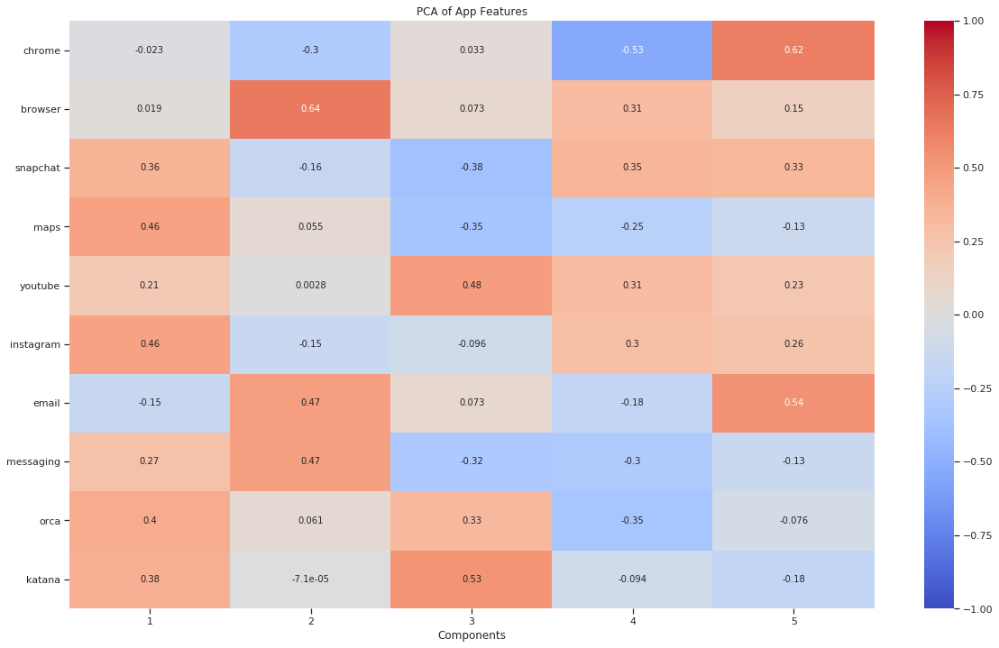

In [68]:
ls_utils.plot_decomp_components(phq_fga_transformer, n_comps, fga_cols, "PCA of App Features")

In [69]:
ls_utils.get_var_explained(phq_fga_transformer)

,var_explained
0,0.148740
1,0.127185
2,0.122590
3,0.112328
4,0.098905


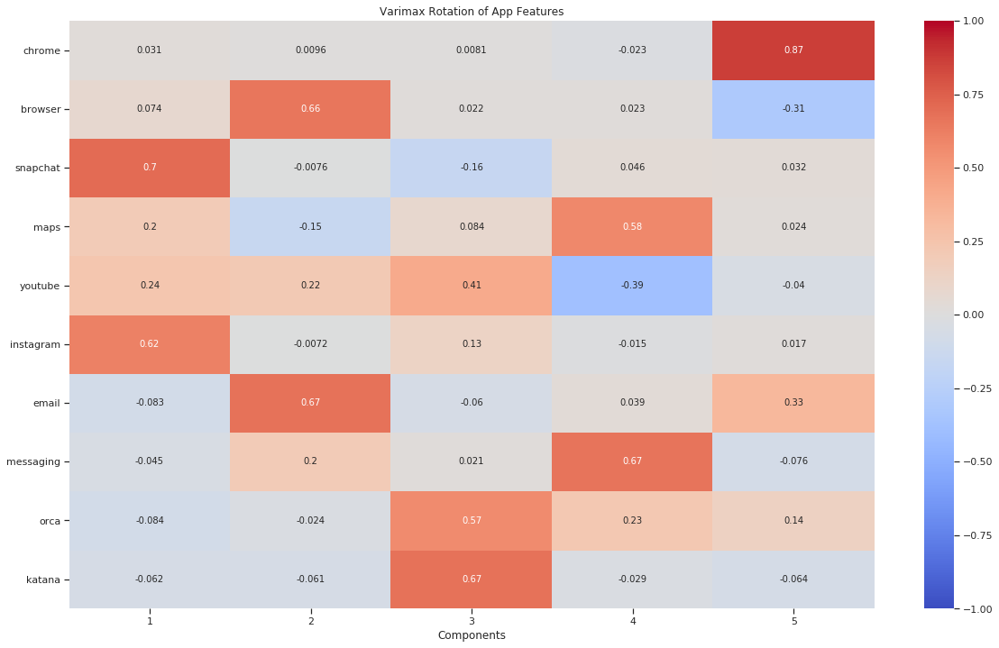

In [70]:
ls_utils.plot_varimax(phq_fga_transformer, n_comps, fga_cols, "Varimax Rotation of App Features")

In [72]:
phq_agg_df = phq_agg_df.merge(phq_fga_pca_df, how='left', on=id_cols)

### sloc

In [73]:
sloc_dur_cols = sloc_daily.columns[sloc_daily.columns.str.endswith('dur')]
n_comps = 4
agg_name = 'sloc'
phq_sloc_pca_df, phq_sloc_transformer = ls_utils.generate_decomp_features(phq_state_df, sloc_dur_cols, id_cols, n_comps, agg_name, method='pca')

In [74]:
phq_agg_df = phq_agg_df.merge(phq_sloc_pca_df, how='left', on=id_cols)

### comm

In [75]:
phq_agg_df[sms_cols] = (phq_agg_df[sms_cols] - phq_agg_df[sms_cols].mean()) / phq_agg_df[sms_cols].std()
phq_agg_df[cal_cols] = (phq_agg_df[cal_cols] - phq_agg_df[cal_cols].mean()) / phq_agg_df[cal_cols].std()
phq_agg_df['sms_agg'] = phq_agg_df[sms_cols].mean(axis=1)
phq_agg_df['cal_agg'] = phq_agg_df[cal_cols].mean(axis=1)

### fus

In [78]:
loc_cols = circ_cols + fus_cols
n_comps = 3
agg_name = 'fus'
phq_fus_pca_df, phq_fus_transformer = ls_utils.generate_decomp_features(phq_state_df, loc_cols, id_cols, n_comps, agg_name, method='pca')

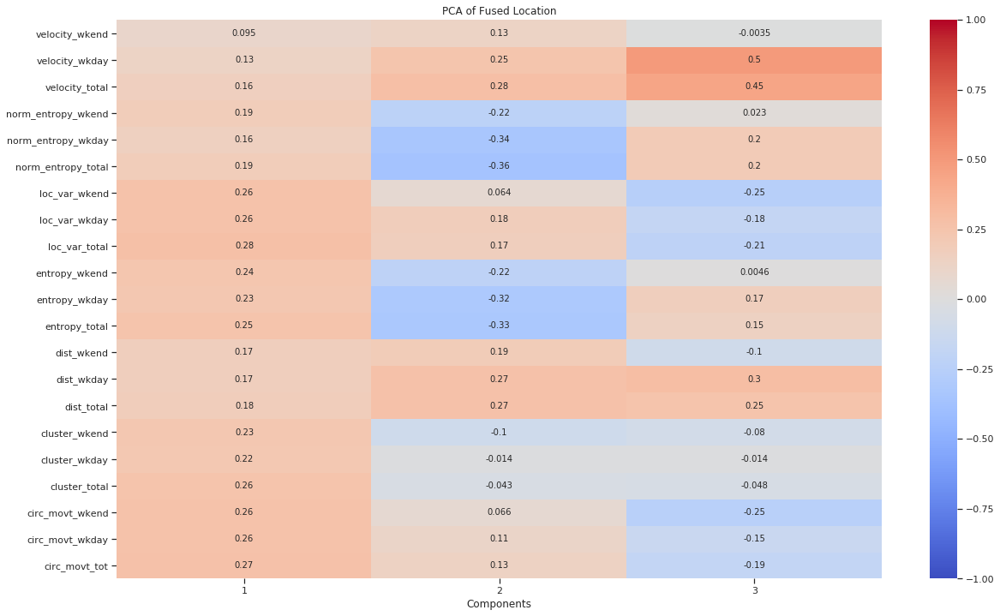

In [79]:
ls_utils.plot_decomp_components(phq_fus_transformer, n_comps, loc_cols, "PCA of Fused Location")

In [80]:
ls_utils.get_var_explained(phq_fus_transformer)

,var_explained
0,0.428368
1,0.164374
2,0.109315


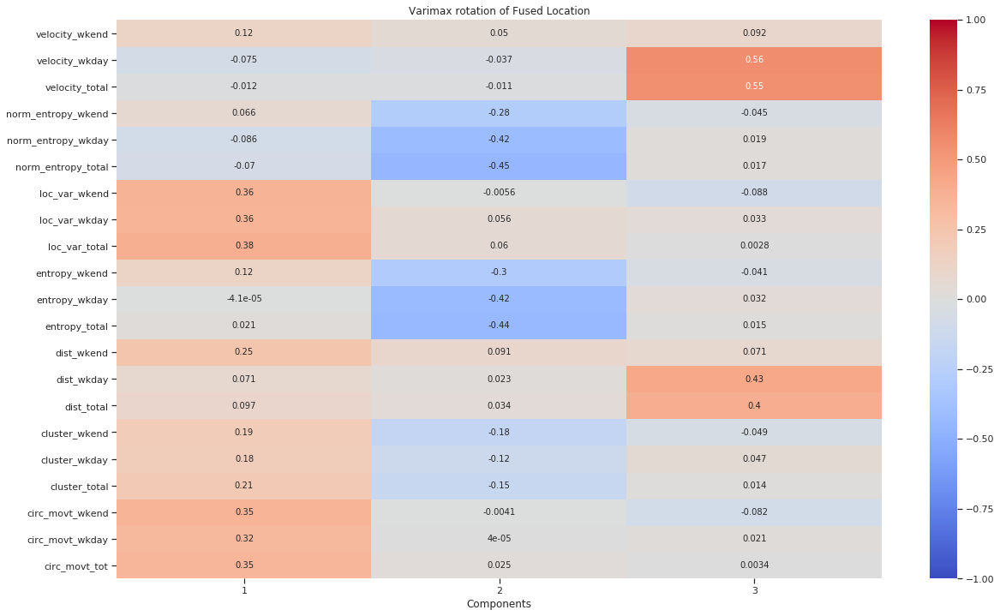

In [81]:
ls_utils.plot_varimax(phq_fus_transformer, n_comps, loc_cols, "Varimax rotation of Fused Location")

In [82]:
phq_agg_df = phq_agg_df.merge(phq_fus_pca_df, how='left', on=id_cols)

## Shift feature columns

In [83]:
agg_cols = phq_agg_df.columns[phq_agg_df.columns.str.endswith("agg")]
agg_cols_shift = [s + '_shift' for s in agg_cols]
agg_cols_change = [s + '_change' for s in agg_cols]

In [84]:
phq_agg_df[agg_cols_shift] = phq_agg_df.groupby('pid')[agg_cols].shift(1)

In [85]:
for cur, prev, change in zip(agg_cols, agg_cols_shift, agg_cols_change):
    phq_agg_df[change] = phq_agg_df[cur] - phq_agg_df[prev]

## Correlations

### Simple Correlation

#### Entire population

In [87]:
phq_agg_df[['fga_pca5_agg_change', 'fga_pca5_agg', 'phq_total_sc', 'phq_diff']].head()

,fga_pca5_agg_change,fga_pca5_agg,phq_total_sc,phq_diff
0,NaN,0.955867,7.0,NaN
1,-0.937589,0.018278,9.0,2.0
2,0.640138,0.658416,7.0,-2.0
3,-0.263073,0.395343,9.0,2.0
4,-0.336769,0.058574,14.0,5.0


In [88]:
phq_agg_df['phq_diff'].describe()

count    1025.000000
mean        0.008618
std         2.880980
min       -15.000000
25%        -1.000000
50%         0.000000
75%         1.000000
max        16.000000
Name: phq_diff, dtype: float64

In [89]:
print("Pearson")
pair_corr_df = pg.pairwise_corr(phq_agg_df, columns=[agg_cols_change, ['phq_diff']], padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])
print("Spearman")
pair_corr_df = pg.pairwise_corr(phq_agg_df, columns=[agg_cols_change, ['phq_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust
14,fus_pca1_agg_change,phq_diff,761,-0.127,0.007625,fdr_bh


Spearman


,X,Y,n,r,p-corr,p-adjust
14,fus_pca1_agg_change,phq_diff,761,-0.117,0.021813,fdr_bh


#### no_symp

In [90]:
sel_state_df = phq_agg_df[phq_agg_df['baseline_cluster'] == 'no_symp']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust
9,sloc_pca2_agg_change,phq_diff,255,-0.177,0.078067,fdr_bh


Spearman


,X,Y,n,r,p-corr,p-adjust


#### soc_anx

In [91]:
sel_state_df = phq_agg_df[phq_agg_df['baseline_cluster'] == 'soc_anx']

print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### gen_anx

In [92]:
sel_state_df = phq_agg_df[phq_agg_df['baseline_cluster'] == 'gen_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', method='pearson', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### dep_anx

In [93]:
sel_state_df = phq_agg_df[phq_agg_df['baseline_cluster'] == 'dep_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust
0,active_apps_agg_change,phq_diff,149,-0.335,0.000254,fdr_bh
14,fus_pca1_agg_change,phq_diff,142,-0.353,0.000254,fdr_bh
5,fga_pca3_agg_change,phq_diff,149,0.238,0.014489,fdr_bh
15,fus_pca2_agg_change,phq_diff,142,-0.251,0.014489,fdr_bh
16,fus_pca3_agg_change,phq_diff,142,-0.207,0.046000,fdr_bh
4,fga_pca2_agg_change,phq_diff,149,-0.182,0.075253,fdr_bh


Spearman


,X,Y,n,r,p-corr,p-adjust
14,fus_pca1_agg_change,phq_diff,142,-0.257,0.034757,fdr_bh


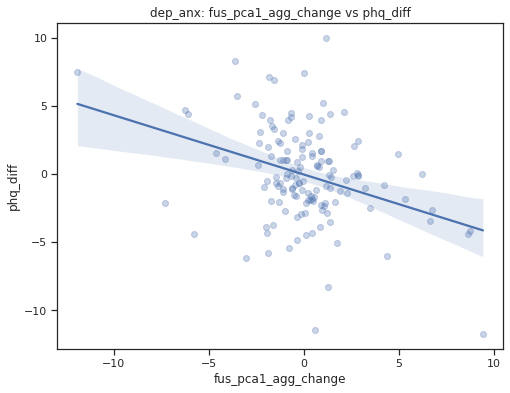

In [98]:
ls_utils.plot_cluster_scatter('fus_pca1_agg_change', 'phq_diff', phq_agg_df, 'dep_anx', (8,6))

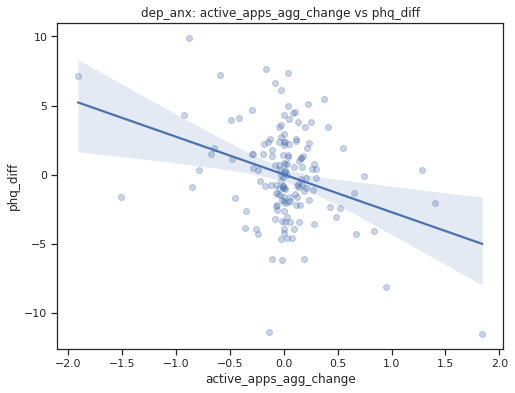

In [99]:
ls_utils.plot_cluster_scatter('active_apps_agg_change', 'phq_diff', phq_agg_df, 'dep_anx', (8,6))

In [100]:
phq_agg_df[agg_cols_change].isna().sum()

active_apps_agg_change     416
passive_apps_agg_change    416
social_apps_agg_change     416
fga_pca1_agg_change        416
fga_pca2_agg_change        416
fga_pca3_agg_change        416
fga_pca4_agg_change        416
fga_pca5_agg_change        416
sloc_pca1_agg_change       416
sloc_pca2_agg_change       416
sloc_pca3_agg_change       416
sloc_pca4_agg_change       416
sms_agg_change             432
cal_agg_change             423
fus_pca1_agg_change        469
fus_pca2_agg_change        469
fus_pca3_agg_change        469
dtype: int64

### Repeated Measures Correlation

In [272]:
pg.rm_corr(data=phq_agg_df, x='fus_pca1_agg_change', y='phq_diff', subject='pid')

/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2526: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c

,r,dof,pval,CI95%,power
rm_corr,-0.128,576,0.002109,"[-0.21, -0.05]",0.869


In [285]:
sel_df = phq_agg_df[phq_agg_df['baseline_cluster'] == 'dep_anx']
#sel_df = sel_df.dropna(subset=['phq_diff', 'fus_pca1_agg_change'], axis='rows')
display(pg.rm_corr(data=sel_df, x='fus_pca1_agg_change', y='phq_diff', subject='pid'))
#pg.plot_rm_corr(data=sel_df, x='fus_pca1_agg_change', y='phq_diff', subject='pid')

,r,dof,pval,CI95%,power
rm_corr,-0.362,108,0.000101,"[-0.51, -0.19]",0.976


In [417]:
#sel_df = sel_df.dropna(subset=['phq_diff', 'fus_pca1_agg_change'], axis='rows')
display(pg.rm_corr(data=sel_df, x='active_apps_agg_change', y='phq_diff', subject='pid'))

/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2526: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/tliu/.conda/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,r,dof,pval,CI95%,power
rm_corr,-0.345,114,0.000147,"[-0.5, -0.17]",0.97


# Reverse PHQ

## Build reversed df

In [418]:
# load fus and circ data
rev_fus_daily = pd.read_pickle("wave1_features/fus_phq_start_0_14.df")
rev_circ_dict = pickle.load(open("wave1_features/circ_phq_start_0_14.dict", "rb"))

In [419]:
# correction for Series values in list, though it doesn't seem to have affected anything??
rev_new_dict = {}
for col, vals in rev_circ_dict.items():
    new_vals = []
    for v in vals:
        if isinstance(v, pd.Series):
            new_vals.append(v[0])
        else:
            new_vals.append(v)
    rev_new_dict[col] = new_vals
rev_circ_dict = rev_new_dict

### Calculate shifted change

In [420]:
%%time

sms_dict = ls_utils.build_col_dict(sms_cols, sms_daily, shift_df, 'phq_start', pre_days=0, post_days=14)
cal_dict = ls_utils.build_col_dict(cal_cols, cal_daily, shift_df, 'phq_start', pre_days=0, post_days=14)
fga_dict = ls_utils.build_col_dict(fga_cols, fga_daily, shift_df, 'phq_start', pre_days=0, post_days=14)
sloc_dict = ls_utils.build_col_dict(sloc_cols, sloc_daily, shift_df, 'phq_start', pre_days=0, post_days=14)

CPU times: user 45.9 s, sys: 33.1 ms, total: 45.9 s
Wall time: 45.9 s


In [421]:
rev_phq_df = shift_df.copy()

sensor_dicts = [sms_dict, cal_dict, fga_dict, sloc_dict, rev_circ_dict]
sensor_cols = sms_cols + cal_cols + fga_cols + sloc_cols + circ_cols

for sensor_dict in sensor_dicts:
    for col, vals in sensor_dict.items():
        rev_phq_df[col] = vals

# merge fused location       
rev_phq_df = rev_phq_df.merge(rev_fus_daily, how='left', on=['pid', 'study_wk'])
rev_phq_df = rev_phq_df.replace([np.inf, -np.inf], np.nan)

## Aggregate features

### Foreground Application

In [422]:
rev_phq_agg_df = rev_phq_df.copy()
rev_phq_agg_df[fga_cols] = (rev_phq_agg_df[fga_cols] - rev_phq_agg_df[fga_cols].mean()) / rev_phq_agg_df[fga_cols].std()
rev_phq_agg_df['active_apps_agg'] = rev_phq_agg_df[active_apps].mean(axis=1)
rev_phq_agg_df['passive_apps_agg'] = rev_phq_agg_df[passive_apps].mean(axis=1)
rev_phq_agg_df['social_apps_agg'] = rev_phq_agg_df[social_apps].mean(axis=1)

In [423]:
n_comps = 5
agg_name = 'fga'
fga_pca_df, fga_transformer = ls_utils.generate_decomp_features(rev_phq_df, fga_cols, id_cols, n_comps, agg_name, method='pca')

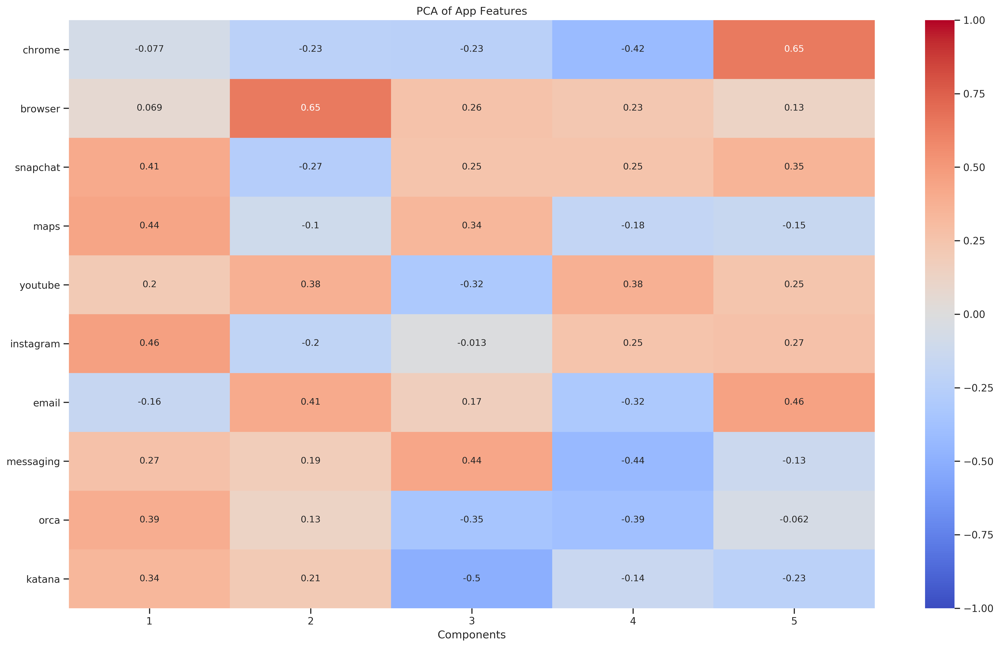

In [424]:
ls_utils.plot_decomp_components(fga_transformer, n_comps, fga_cols, "PCA of App Features")

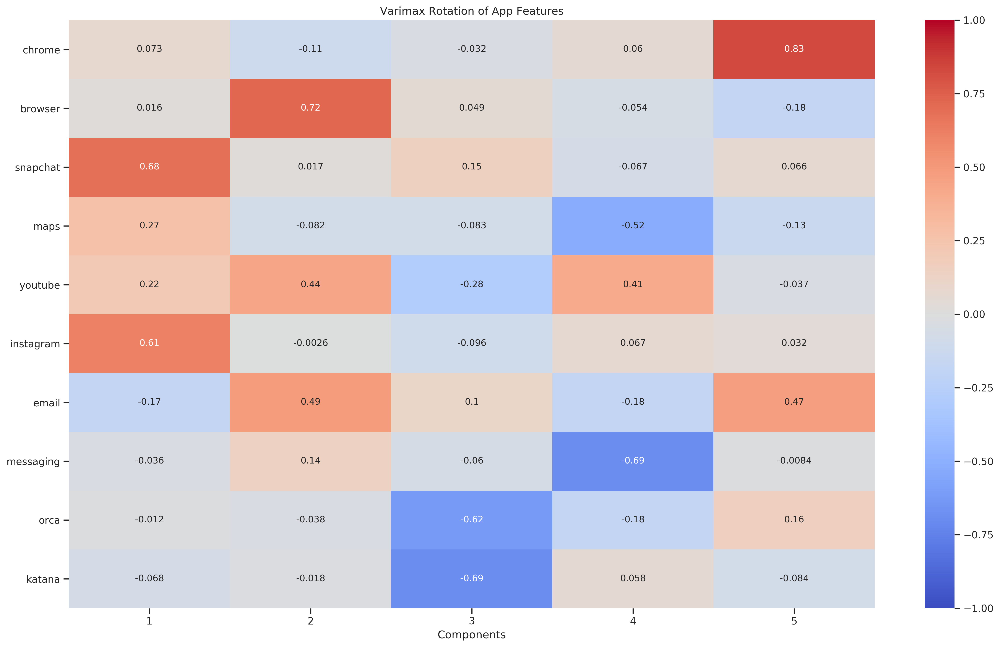

In [425]:
ls_utils.plot_varimax(fga_transformer, n_comps, fga_cols, "Varimax Rotation of App Features")

In [426]:
ls_utils.get_var_explained(fga_transformer)

,var_explained
0,0.146384
1,0.127435
2,0.124173
3,0.113895
4,0.100071


In [427]:
rev_phq_agg_df = rev_phq_agg_df.merge(fga_pca_df, how='left', on=id_cols)

### Semantic Location

In [428]:
sloc_dur_cols = sloc_daily.columns[sloc_daily.columns.str.endswith('dur')]
n_comps = 4
agg_name = 'sloc'
sloc_pca_df, sloc_transformer = ls_utils.generate_decomp_features(rev_phq_df, sloc_dur_cols, id_cols, n_comps, agg_name, method='pca')

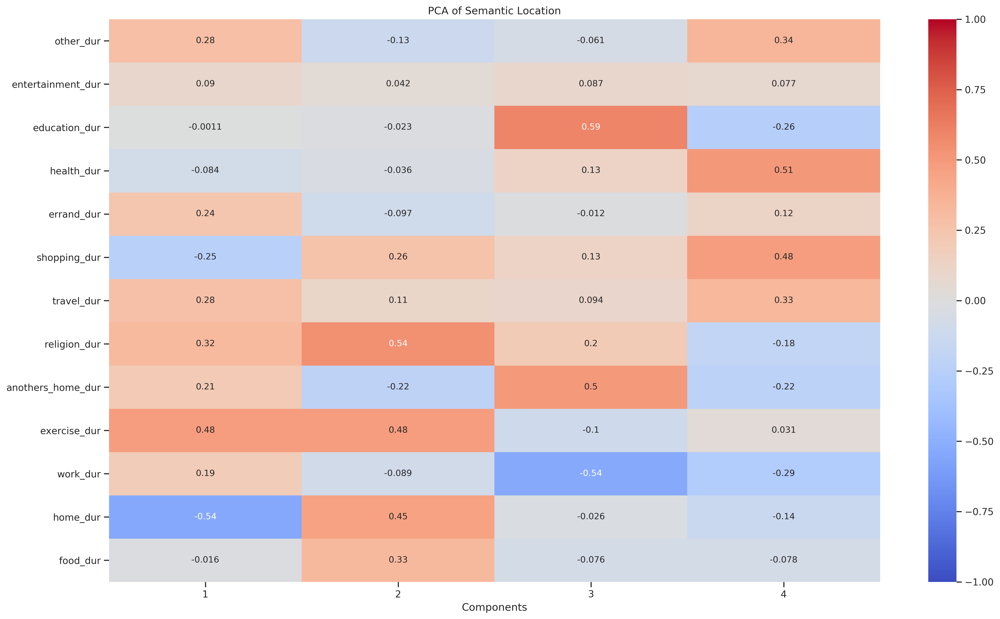

In [429]:
ls_utils.plot_decomp_components(sloc_transformer, n_comps, sloc_dur_cols, "PCA of Semantic Location")

In [430]:
ls_utils.get_var_explained(sloc_transformer)

,var_explained
0,0.119291
1,0.103665
2,0.093742
3,0.087142


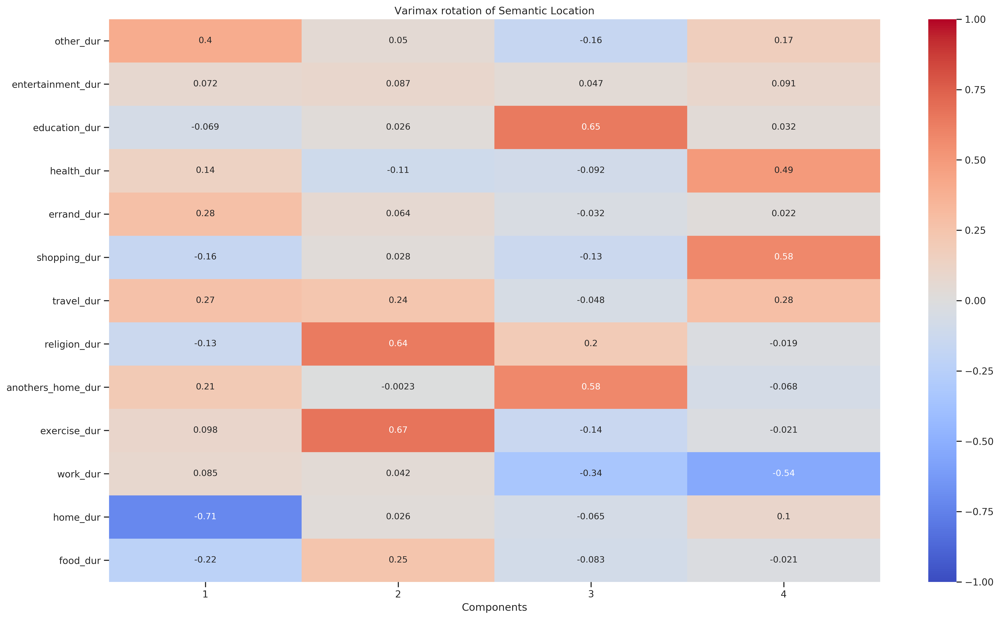

In [431]:
ls_utils.plot_varimax(sloc_transformer, n_comps, sloc_dur_cols, "Varimax rotation of Semantic Location")

In [432]:
rev_phq_agg_df = rev_phq_agg_df.merge(sloc_pca_df, how='left', on=id_cols)

### Semantic Location Transitions

- TODO

### Communication

In [433]:
rev_phq_agg_df[sms_cols] = (rev_phq_agg_df[sms_cols] - rev_phq_agg_df[sms_cols].mean()) / rev_phq_agg_df[sms_cols].std()
rev_phq_agg_df[cal_cols] = (rev_phq_agg_df[cal_cols] - rev_phq_agg_df[cal_cols].mean()) / rev_phq_agg_df[cal_cols].std()
rev_phq_agg_df['sms_agg'] = rev_phq_agg_df[sms_cols].mean(axis=1)
rev_phq_agg_df['cal_agg'] = rev_phq_agg_df[cal_cols].mean(axis=1)

### Fused Location

In [434]:
loc_cols = circ_cols + fus_cols
n_comps = 3
agg_name = 'fus'
fus_pca_df, fus_transformer = ls_utils.generate_decomp_features(rev_phq_df, loc_cols, id_cols, n_comps, agg_name, method='pca')

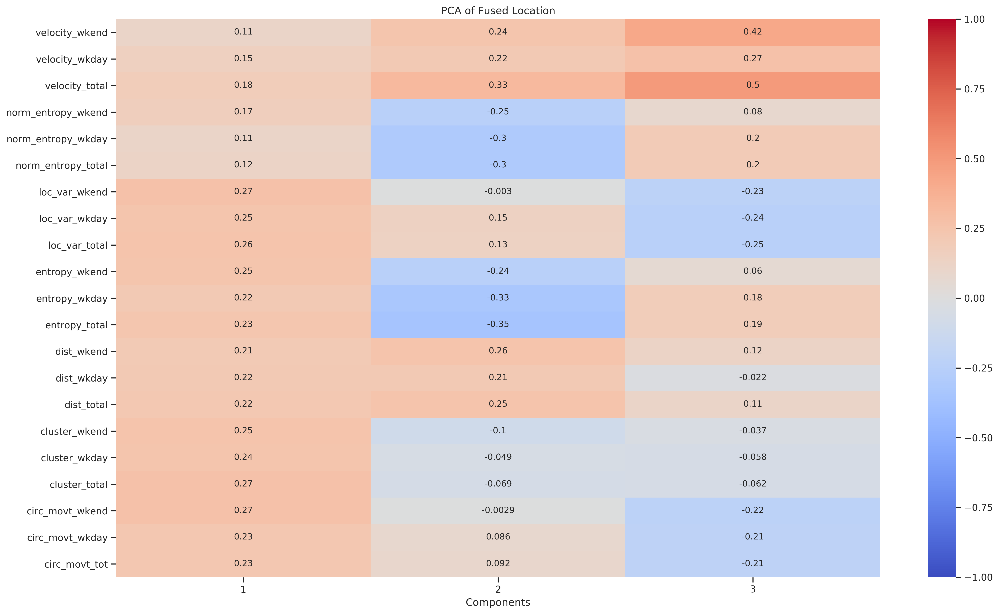

In [435]:
ls_utils.plot_decomp_components(fus_transformer, n_comps, loc_cols, "PCA of Fused Location")

In [436]:
ls_utils.get_var_explained(fus_transformer)

,var_explained
0,0.434708
1,0.145842
2,0.100053


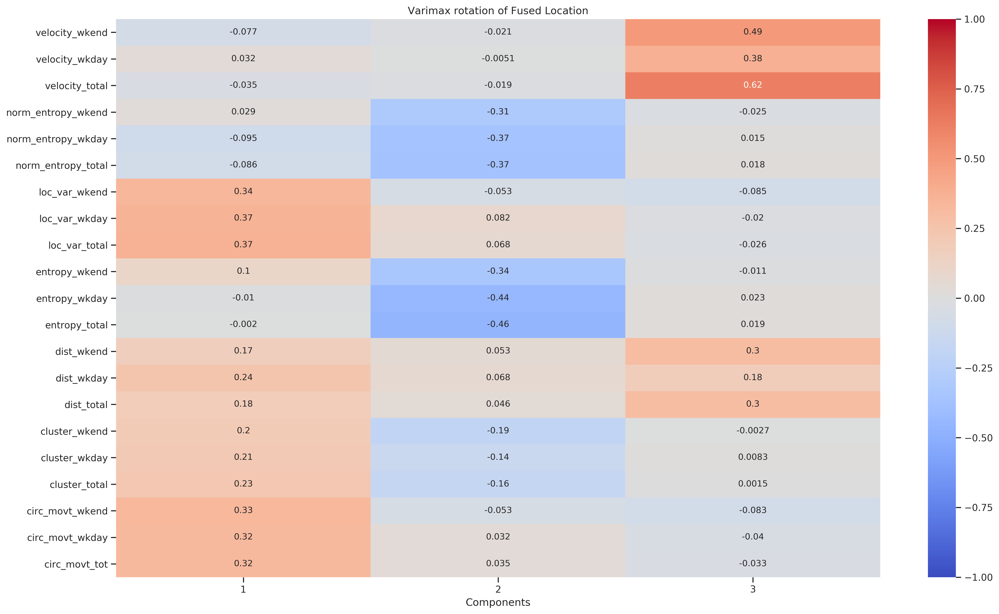

In [437]:
ls_utils.plot_varimax(fus_transformer, n_comps, loc_cols, "Varimax rotation of Fused Location")

In [438]:
rev_phq_agg_df = rev_phq_agg_df.merge(fus_pca_df, how='left', on=id_cols)

## Shift columns

In [439]:
agg_cols = rev_phq_agg_df.columns[rev_phq_agg_df.columns.str.endswith("agg")]
agg_cols_shift = [s + '_shift' for s in agg_cols]
agg_cols_change = [s + '_change' for s in agg_cols]

In [440]:
rev_phq_agg_df[agg_cols_shift] = rev_phq_agg_df.groupby('pid')[agg_cols].shift(1)

In [441]:
for cur, prev, change in zip(agg_cols, agg_cols_shift, agg_cols_change):
    rev_phq_agg_df[change] = rev_phq_agg_df[cur] - rev_phq_agg_df[prev]

In [442]:
rev_phq_agg_df['phq_diff'].describe()

count    1025.000000
mean        0.008618
std         2.880980
min       -15.000000
25%        -1.000000
50%         0.000000
75%         1.000000
max        16.000000
Name: phq_diff, dtype: float64

## Correlations

#### Full population

In [443]:
print("Pearson")
pair_corr_df = pg.pairwise_corr(rev_phq_agg_df, columns=[agg_cols_change, ['phq_diff']], padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])
print("Spearman")
pair_corr_df = pg.pairwise_corr(rev_phq_agg_df, columns=[agg_cols_change, ['phq_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[pair_corr_df['p-corr'] < 0.1].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### no_symp

In [444]:
sel_state_df = rev_phq_agg_df[rev_phq_agg_df['baseline_cluster'] == 'no_symp']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust
1,passive_apps_agg_change,phq_diff,255,0.174,0.091401,fdr_bh


#### soc_anx

In [445]:
sel_state_df = rev_phq_agg_df[rev_phq_agg_df['baseline_cluster'] == 'soc_anx']

print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### gen_anx

In [446]:
sel_state_df = rev_phq_agg_df[rev_phq_agg_df['baseline_cluster'] == 'gen_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', method='pearson', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust


Spearman


,X,Y,n,r,p-corr,p-adjust


#### dep_anx

In [447]:
sel_state_df = rev_phq_agg_df[rev_phq_agg_df['baseline_cluster'] == 'dep_anx']
print("Pearson")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], nan_policy='pairwise', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

print("Spearman")
pair_corr_df = pg.pairwise_corr(sel_state_df, columns=[agg_cols_change, ['phq_diff']], method='spearman', padjust="fdr_bh")
display(pair_corr_df[(pair_corr_df['p-corr'] < 0.1)].sort_values(by='p-corr')[['X', 'Y', 'n', 'r', 'p-corr', 'p-adjust']])

Pearson


,X,Y,n,r,p-corr,p-adjust
0,active_apps_agg_change,phq_diff,149,0.224,0.033683,fdr_bh
7,fga_pca5_agg_change,phq_diff,149,-0.246,0.033683,fdr_bh
15,fus_pca2_agg_change,phq_diff,128,0.246,0.033683,fdr_bh


Spearman


,X,Y,n,r,p-corr,p-adjust


# Change over Time Periods Analysis

## Functions

In [198]:
def plot_over_time(cols, df, title, study_wks=[4,7,10,13,16], figsize=(8,6)):
    _, ax = plt.subplots(figsize=figsize)
    for col in cols:
        cal_pairs = df[df['X'] == col]
        errs = np.concatenate(cal_pairs['CI95%'].values).reshape(len(cal_pairs['r'].values),2).T
        #print(len(cal_pairs['r'].values))
        errs = errs - cal_pairs['r'].values
        errs = np.abs(errs)
        #errs = np.flip(errs,0)
        plt.errorbar(x=cal_pairs['idx'], y=cal_pairs['r'], yerr=errs, label=col, capsize=5)
    

    plt.axhline(y=0, ls='--')
    plt.xlabel("study_wk")
    plt.xticks(study_wks)
    plt.title(title)
    plt.legend()
    
    return plt    

In [170]:
def build_time_corr_df(seq_df, target, feat_cols, study_wks=[4,7,10,13,16]):
    pair_df = pd.DataFrame()
    for idx in study_wks:
        sel_df = seq_df[seq_df['study_wk'] == idx]
        #sel_df = sel_df.dropna(subset=['date'])
        sel_df = sel_df[[target] + feat_cols]
        df = pg.pairwise_corr(sel_df, columns=[feat_cols, [target]], padjust="fdr_bh")
        df['idx'] = idx
        pair_df = pair_df.append(df)
        
    return pair_df

## PHQ

In [159]:
pop_df = build_time_corr_df(phq_agg_df, 'phq_diff', agg_cols_change)

4
    phq_diff  active_apps_agg_change  passive_apps_agg_change  \
1        2.0               -0.642493                -0.407097   
7       -1.6                     NaN                      NaN   
13      -1.0               -0.022619                -0.282366   
19       3.0               -0.141241                 0.064796   
25      -1.0               -0.132492                -0.081417   

    social_apps_agg_change  fga_pca1_agg_change  fga_pca2_agg_change  \
1                 0.442989             0.106544            -1.135232   
7                      NaN                  NaN                  NaN   
13               -0.006080             0.120139            -1.024522   
19                0.000000            -0.079040            -0.213265   
25               -0.003481            -0.267486            -0.169660   

    fga_pca3_agg_change  fga_pca4_agg_change  fga_pca5_agg_change  \
1              1.711287            -0.352626            -0.937589   
7                   NaN             

In [160]:
pop_df[pop_df['X'] == 'fus_pca1_agg_change'][['X', 'Y', 'n', 'r', 'idx', 'p-unc','p-corr', 'p-adjust', 'CI95%']]

,X,Y,n,r,idx,p-unc,p-corr,p-adjust,CI95%
14,fus_pca1_agg_change,phq_diff,147,-0.037,4,0.658976,0.864497,fdr_bh,"[-0.2, 0.13]"
14,fus_pca1_agg_change,phq_diff,142,-0.246,7,0.003217,0.054694,fdr_bh,"[-0.39, -0.08]"
14,fus_pca1_agg_change,phq_diff,159,-0.154,10,0.052347,0.444952,fdr_bh,"[-0.3, 0.0]"
14,fus_pca1_agg_change,phq_diff,160,-0.008,13,0.918166,0.975552,fdr_bh,"[-0.16, 0.15]"
14,fus_pca1_agg_change,phq_diff,153,-0.142,16,0.080595,0.796960,fdr_bh,"[-0.29, 0.02]"


(-1, 0.6)

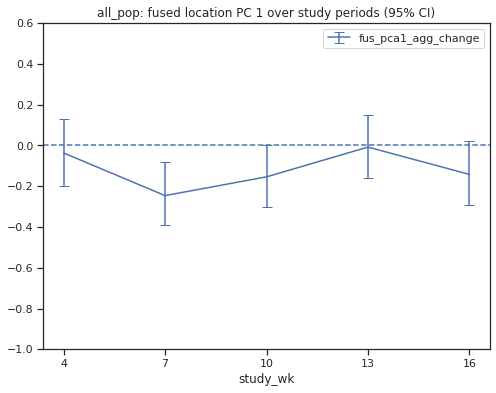

In [207]:
p = plot_over_time(['fus_pca1_agg_change'], pop_df, "all_pop: fused location PC 1 over study periods (95% CI)")
p.ylim(-1,0.6)

In [184]:
dep_anx_df = build_time_corr_df(phq_agg_df[phq_agg_df['baseline_cluster'] == 'dep_anx'], 'phq_diff', agg_cols_change)

In [185]:
dep_anx_df[dep_anx_df['X'] == 'fus_pca1_agg_change'][['X', 'Y', 'n', 'r', 'idx', 'p-unc','p-corr', 'p-adjust', 'CI95%']]

,X,Y,n,r,idx,p-unc,p-corr,p-adjust,CI95%
14,fus_pca1_agg_change,phq_diff,28,-0.394,4,0.038164,0.518786,fdr_bh,"[-0.67, -0.02]"
14,fus_pca1_agg_change,phq_diff,26,-0.670,7,0.000179,0.003037,fdr_bh,"[-0.84, -0.38]"
14,fus_pca1_agg_change,phq_diff,28,-0.406,10,0.031869,0.147447,fdr_bh,"[-0.68, -0.04]"
14,fus_pca1_agg_change,phq_diff,30,0.185,13,0.328274,0.767287,fdr_bh,"[-0.19, 0.51]"
14,fus_pca1_agg_change,phq_diff,30,-0.234,16,0.212701,0.602652,fdr_bh,"[-0.55, 0.14]"


(-1, 0.6)

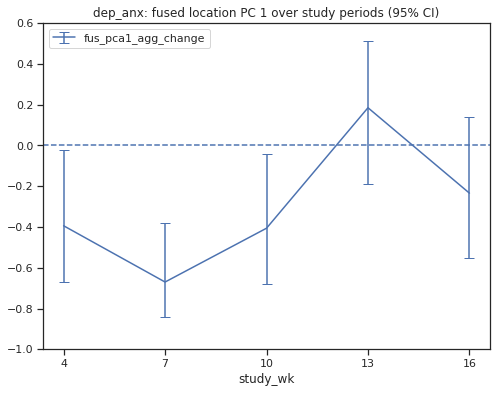

In [206]:
p = plot_over_time(['fus_pca1_agg_change'], dep_anx_df, "dep_anx: fused location PC 1 over study periods (95% CI)")
p.ylim(-1,0.6)

## GAD

In [171]:
gad_df = build_time_corr_df(agg_df, 'gad_diff', agg_cols_change, study_wks=[7,10,13,16])

In [172]:
gad_df[gad_df['X'] == 'social_apps_agg_change']

,X,Y,method,tail,n,r,CI95%,r2,adj_r2,z,p-unc,p-corr,p-adjust,BF10,power,idx
2,social_apps_agg_change,gad_diff,pearson,two-sided,191,-0.119,"[-0.26, 0.02]",0.014,0.004,-0.120,0.101252,0.384823,fdr_bh,0.343,0.375,7
2,social_apps_agg_change,gad_diff,pearson,two-sided,191,0.079,"[-0.06, 0.22]",0.006,-0.004,0.079,0.274619,0.553709,fdr_bh,0.164,0.194,10
2,social_apps_agg_change,gad_diff,pearson,two-sided,193,-0.023,"[-0.16, 0.12]",0.001,-0.010,-0.023,0.752218,0.850788,fdr_bh,0.095,0.061,13
2,social_apps_agg_change,gad_diff,pearson,two-sided,193,0.054,"[-0.09, 0.19]",0.003,-0.008,0.054,0.456001,0.672111,fdr_bh,0.119,0.116,16


In [174]:
dep_anx_gad_df = build_time_corr_df(agg_df[agg_df['baseline_cluster'] == 'dep_anx'], 'gad_diff', agg_cols_change, study_wks=[7,10,13,16])

In [175]:
dep_anx_gad_df[dep_anx_gad_df['X'] == 'social_apps_agg_change']

,X,Y,method,tail,n,r,CI95%,r2,adj_r2,z,p-unc,p-corr,p-adjust,BF10,power,idx
2,social_apps_agg_change,gad_diff,pearson,two-sided,35,-0.233,"[-0.53, 0.11]",0.054,-0.005,-0.237,0.177243,0.930010,fdr_bh,0.504,0.275,7
2,social_apps_agg_change,gad_diff,pearson,two-sided,34,0.194,"[-0.15, 0.5]",0.038,-0.024,0.196,0.271485,0.592460,fdr_bh,0.381,0.198,10
2,social_apps_agg_change,gad_diff,pearson,two-sided,34,-0.182,"[-0.49, 0.17]",0.033,-0.029,-0.184,0.301913,0.978479,fdr_bh,0.356,0.180,13
2,social_apps_agg_change,gad_diff,pearson,two-sided,35,-0.209,"[-0.51, 0.13]",0.044,-0.016,-0.212,0.227154,0.689278,fdr_bh,0.424,0.229,16


## SPIN

In [193]:
spin_df = build_time_corr_df(agg_df, 'spin_diff', agg_cols_change, study_wks=[7,10,13,16])

In [194]:
spin_df[spin_df['X'] == 'passive_apps_agg_change'][['X', 'Y', 'n', 'r', 'idx', 'p-unc','p-corr', 'p-adjust', 'CI95%']]

,X,Y,n,r,idx,p-unc,p-corr,p-adjust,CI95%
1,passive_apps_agg_change,spin_diff,191,0.094,7,0.195317,0.844363,fdr_bh,"[-0.05, 0.23]"
1,passive_apps_agg_change,spin_diff,191,0.090,10,0.214940,0.487346,fdr_bh,"[-0.05, 0.23]"
1,passive_apps_agg_change,spin_diff,193,0.130,13,0.072127,0.201666,fdr_bh,"[-0.01, 0.27]"
1,passive_apps_agg_change,spin_diff,192,0.100,16,0.166357,0.463296,fdr_bh,"[-0.04, 0.24]"


(-0.4, 1)

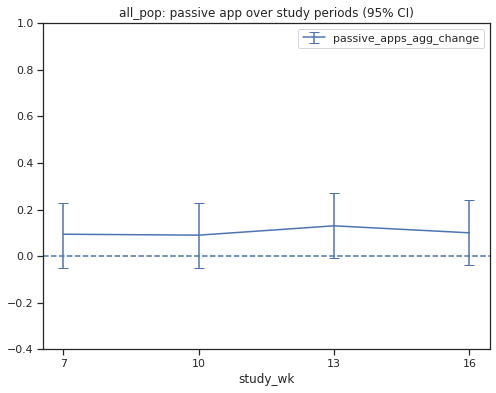

In [215]:
p = plot_over_time(['passive_apps_agg_change'], spin_df, "all_pop: passive app over study periods (95% CI)", study_wks=[7,10,13,16])
p.ylim(-0.4,1)

In [195]:
soc_anx_spin_df = build_time_corr_df(agg_df[agg_df['baseline_cluster'] == 'soc_anx'], 'spin_diff', agg_cols_change, study_wks=[7,10,13,16])

In [196]:
soc_anx_spin_df[dep_anx_spin_df['X'] == 'passive_apps_agg_change'][['X', 'Y', 'n', 'r', 'idx', 'p-unc','p-corr', 'p-adjust', 'CI95%']]

,X,Y,n,r,idx,p-unc,p-corr,p-adjust,CI95%
1,passive_apps_agg_change,spin_diff,50,0.222,7,0.121887,0.414415,fdr_bh,"[-0.06, 0.47]"
1,passive_apps_agg_change,spin_diff,50,0.079,10,0.585368,0.952609,fdr_bh,"[-0.2, 0.35]"
1,passive_apps_agg_change,spin_diff,51,0.415,13,0.002470,0.010498,fdr_bh,"[0.16, 0.62]"
1,passive_apps_agg_change,spin_diff,51,0.209,16,0.140599,0.478038,fdr_bh,"[-0.07, 0.46]"


(-0.4, 1)

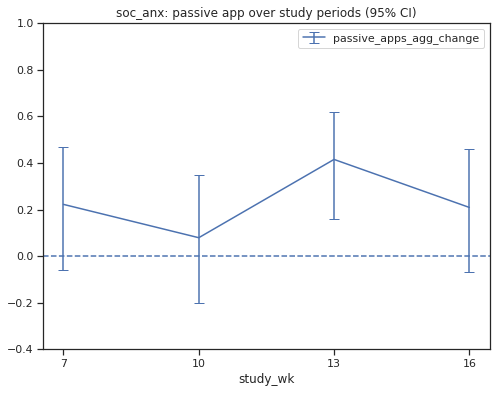

In [213]:
p = plot_over_time(['passive_apps_agg_change'], soc_anx_spin_df, "soc_anx: passive app over study periods (95% CI)", study_wks=[7,10,13,16])
p.ylim(-0.4,1)